In [29]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns 
import sklearn
import warnings
import lasio

from sklearn import preprocessing

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### Log Data

In [30]:
Well1_path = '/Users/rishabhpandey/Desktop/Spring 2021/Data Analytics/Python/MIP_3H_Log Data.las'
Well1 = lasio.read(Well1_path)

In [31]:
Well1.keys()

['DEPT',
 'BS',
 'DTCO',
 'DTSM_FAST',
 'DTSM_SLOW',
 'DTST',
 'FLAG',
 'FSH_AZIM_ERR',
 'FSH_AZIM_FILTERED',
 'FSH_P1NO',
 'GR_EDTC',
 'HAZIM',
 'HD1_PPC1',
 'HD2_PPC1',
 'MAXXENE_OVERALL',
 'MINXENE_OVERALL',
 'P1NO_MAST',
 'PR',
 'RHOB',
 'SDEVM',
 'SLOANI',
 'SPHI',
 'SVCO',
 'SVSH',
 'TENS',
 'TIMANI',
 'TWB',
 'TWE',
 'VPVS']

In [32]:
print(Well1.curves)

Mnemonic           Unit  Value  Description                                                                                 
--------           ----  -----  -----------                                                                                 
DEPT               F            0       Index                                                                               
BS                 IN           1       Bit Size                                                                            
DTCO               US/F         2       Delta-T Compressional                                                               
DTSM_FAST          US/F         3       Shear Slowness of Fast Shear Waves                                                  
DTSM_SLOW          US/F         4       Shear Slowness of Slow Shear Waves                                                  
DTST               US/F         5       Delta-T Stoneley - Monopole Stoneley                                                


### Reading in to a Pandas Dataframe Directly from a .LAS file

In [33]:
Well_Log = lasio.read(Well1_path)
Well_Log.data.shape

(2049, 29)

### Converting the Lasio object to a Pandas Dataframe

In [34]:
logdataframe = Well_Log.df()
logdataframe.head()

,BS,DTCO,DTSM_FAST,DTSM_SLOW,DTST,FLAG,FSH_AZIM_ERR,FSH_AZIM_FILTERED,FSH_P1NO,GR_EDTC,...,SDEVM,SLOANI,SPHI,SVCO,SVSH,TENS,TIMANI,TWB,TWE,VPVS
DEPT,,,,,,,,,,,,,,,,,,,,,
6780.0,NaN,69.35368,126.13476,126.93642,NaN,0.0,3.82432,NaN,72.17480,112.50737,...,0.98444,0.63354,0.15384,14418.84668,7928.02881,2954.85010,1.70753,2421.47803,4421.47803,1.81872
6780.5,NaN,69.20898,126.54207,127.83930,NaN,0.0,3.88246,NaN,72.37598,109.85056,...,0.98439,1.01991,0.15282,14448.99316,7902.51025,2893.52393,1.68287,2420.86084,4420.86084,1.82841
6781.0,NaN,69.00111,126.88505,128.70065,NaN,0.0,4.03048,NaN,72.91884,113.11059,...,0.98087,1.42074,0.15135,14492.52148,7881.14941,2904.14307,1.67328,2419.96240,4419.96191,1.83888
6781.5,NaN,68.79139,127.36251,129.20187,NaN,0.0,4.45320,NaN,73.50179,114.19213,...,0.97574,1.43384,0.14987,14536.70312,7851.60400,3169.64990,1.68305,2418.78638,4418.78613,1.85143
6782.0,NaN,68.82792,127.50982,129.21031,NaN,0.0,4.86375,NaN,73.69418,115.28265,...,0.97168,1.32478,0.15013,14528.98828,7842.53320,3108.52393,1.68499,2417.67432,4417.67432,1.85259


In [35]:
Well_Log = logdataframe.rename_axis('DEPTH').reset_index()
Well_Log.head()

,DEPTH,BS,DTCO,DTSM_FAST,DTSM_SLOW,DTST,FLAG,FSH_AZIM_ERR,FSH_AZIM_FILTERED,FSH_P1NO,...,SDEVM,SLOANI,SPHI,SVCO,SVSH,TENS,TIMANI,TWB,TWE,VPVS
0,6780.0,NaN,69.35368,126.13476,126.93642,NaN,0.0,3.82432,NaN,72.17480,...,0.98444,0.63354,0.15384,14418.84668,7928.02881,2954.85010,1.70753,2421.47803,4421.47803,1.81872
1,6780.5,NaN,69.20898,126.54207,127.83930,NaN,0.0,3.88246,NaN,72.37598,...,0.98439,1.01991,0.15282,14448.99316,7902.51025,2893.52393,1.68287,2420.86084,4420.86084,1.82841
2,6781.0,NaN,69.00111,126.88505,128.70065,NaN,0.0,4.03048,NaN,72.91884,...,0.98087,1.42074,0.15135,14492.52148,7881.14941,2904.14307,1.67328,2419.96240,4419.96191,1.83888
3,6781.5,NaN,68.79139,127.36251,129.20187,NaN,0.0,4.45320,NaN,73.50179,...,0.97574,1.43384,0.14987,14536.70312,7851.60400,3169.64990,1.68305,2418.78638,4418.78613,1.85143
4,6782.0,NaN,68.82792,127.50982,129.21031,NaN,0.0,4.86375,NaN,73.69418,...,0.97168,1.32478,0.15013,14528.98828,7842.53320,3108.52393,1.68499,2417.67432,4417.67432,1.85259


### Selecting Depth and NPHI


In [36]:
Well_Log_1 = Well_Log[['DEPTH', 'DTCO']]

### Matrix Scatter Plot

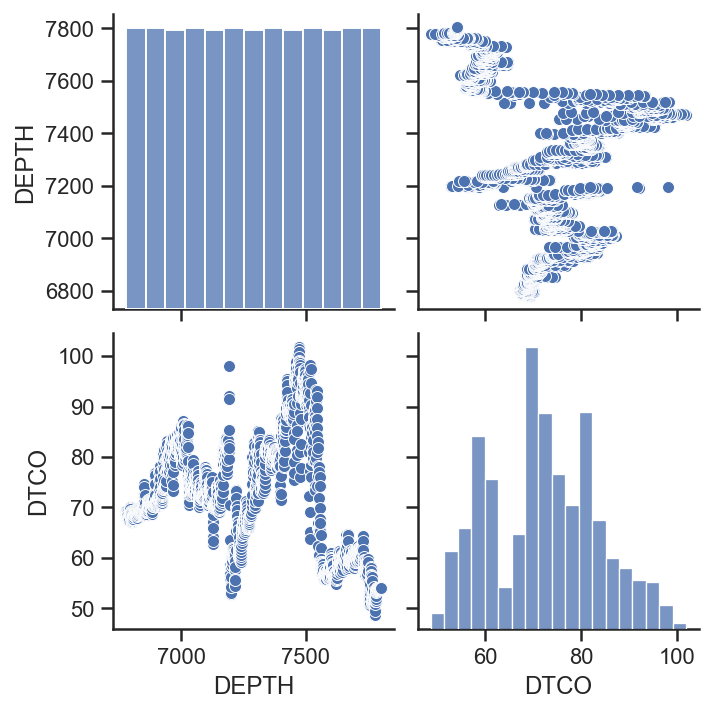

In [37]:
sns.set(style = 'ticks')
sns.pairplot(Well_Log_1)

<AxesSubplot:ylabel='DTCO'>

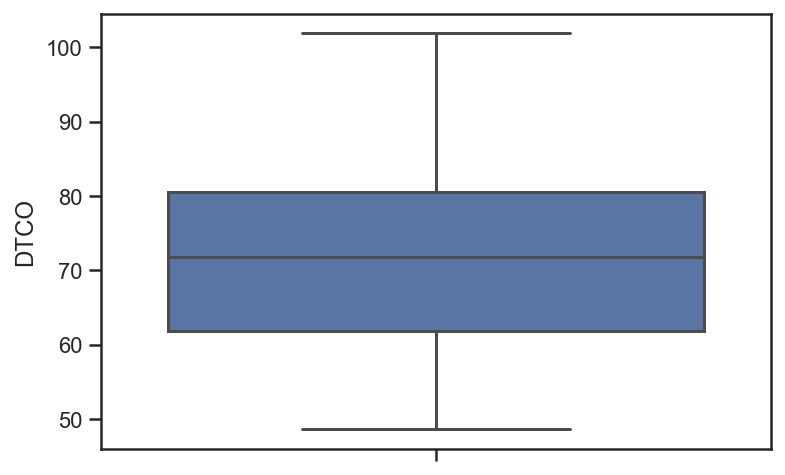

In [38]:
sns.boxplot(y = Well_Log_1['DTCO'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'DTCO'}>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

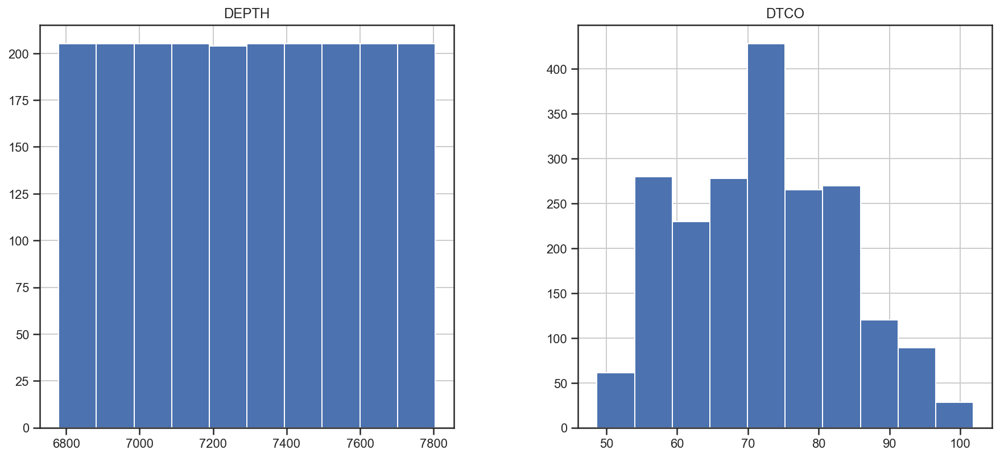

In [39]:
Well_Log_1.hist(figsize = (15, 15), layout = (2,2))

In [40]:
depth = Well_Log_1['DEPTH']
Dtco = Well_Log_1['DTCO']

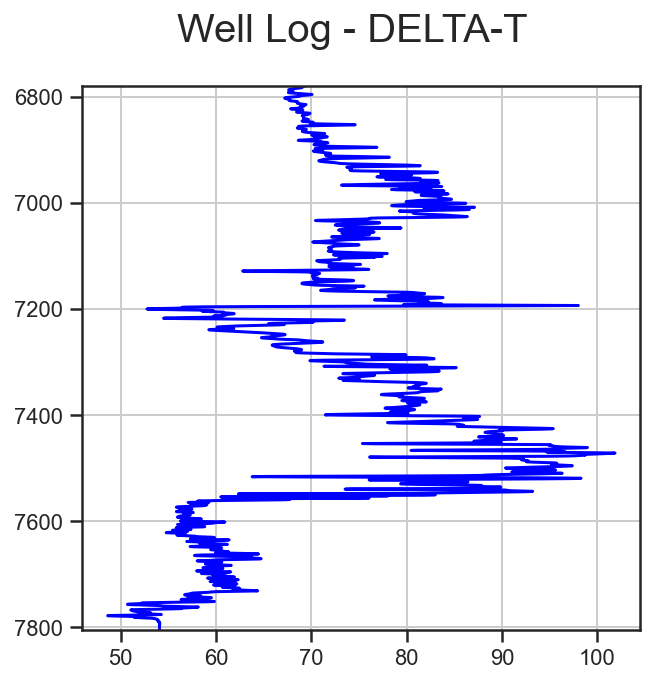

In [41]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - DELTA-T', size=20)

plt.subplot(1,1,1)
plt.plot(Dtco, depth, color='blue')
plt.ylim(max(depth), min(depth))
plt.grid()

plt.show()

### Missing Values

In [42]:
Well_Log_1.isna().sum()

DEPTH    0
DTCO     0
dtype: int64

In [43]:
Well_Log_1.describe()

,DEPTH,DTCO
count,2049.000000,2049.000000
mean,7292.000000,72.144347
std,295.819835,11.200422
min,6780.000000,48.659650
25%,7036.000000,61.781750
50%,7292.000000,71.790740
75%,7548.000000,80.493160
max,7804.000000,101.845850


In [44]:
DTCO_Data = Well_Log_1.copy()

### Removing Outliers

In [45]:
from scipy import stats

DTCO_Data_MIP = DTCO_Data[['DEPTH','DTCO']]

DTCO_Data_MIP = DTCO_Data_MIP[(np.abs(stats.zscore(DTCO_Data_MIP)) < 3).all(axis=1)]

DTCO_Data = DTCO_Data.merge(DTCO_Data_MIP,on=['DEPTH','DTCO'])

In [46]:
DTCO_Data_MIP.describe()

,DEPTH,DTCO
count,2049.000000,2049.000000
mean,7292.000000,72.144347
std,295.819835,11.200422
min,6780.000000,48.659650
25%,7036.000000,61.781750
50%,7292.000000,71.790740
75%,7548.000000,80.493160
max,7804.000000,101.845850


### Matrix Scatter Plots, Box Plots and Histogram after removing Outliers and negative values

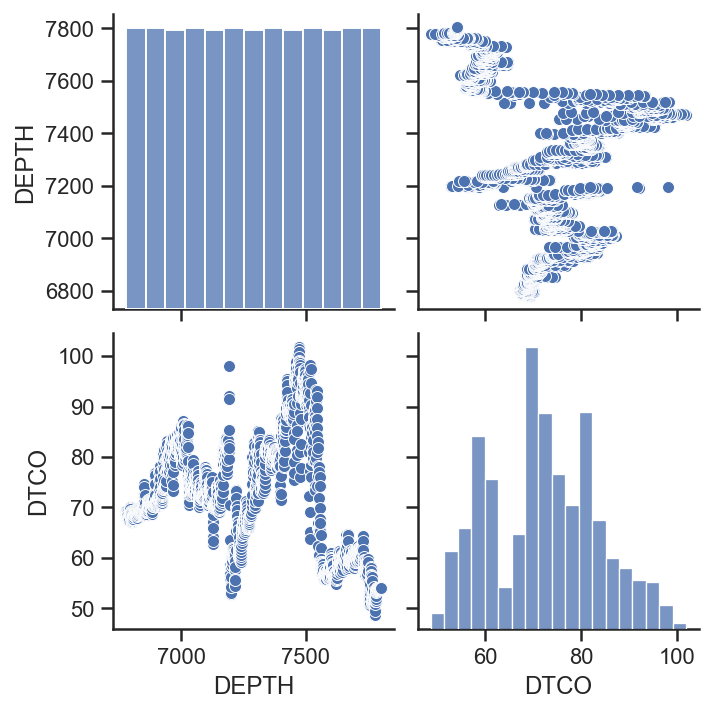

In [47]:
sns.set(style = 'ticks')
sns.pairplot(DTCO_Data_MIP)

<AxesSubplot:ylabel='DTCO'>

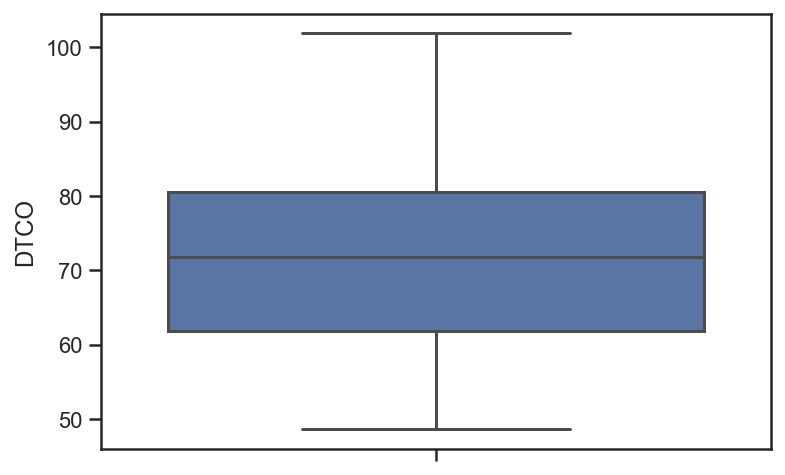

In [48]:
sns.boxplot(y = DTCO_Data_MIP['DTCO'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'DTCO'}>],
       [<AxesSubplot:>, <AxesSubplot:>]], dtype=object)

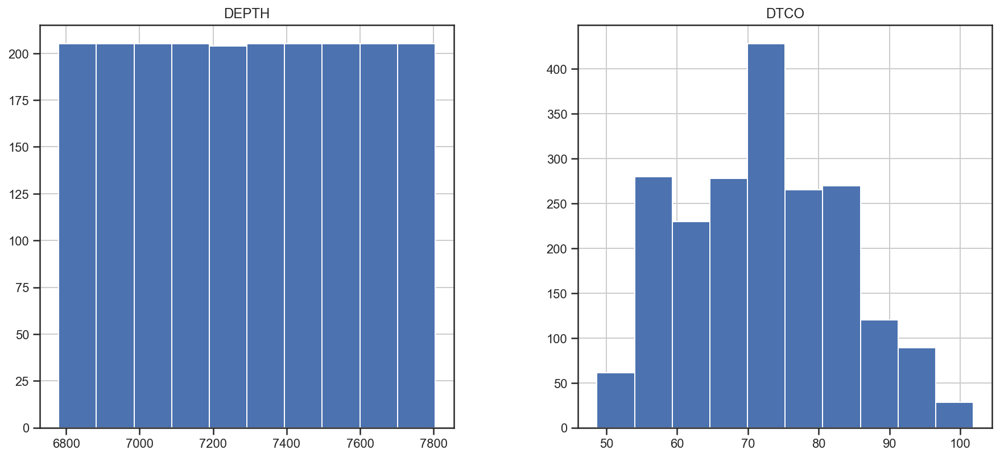

In [49]:
DTCO_Data_MIP.hist(figsize = (15, 15), layout = (2,2))

In [50]:
col_names = list(DTCO_Data_MIP.columns)
print(col_names)

['DEPTH', 'DTCO']


In [51]:
Depth = DTCO_Data_MIP['DEPTH']
DTco = DTCO_Data_MIP['DTCO']

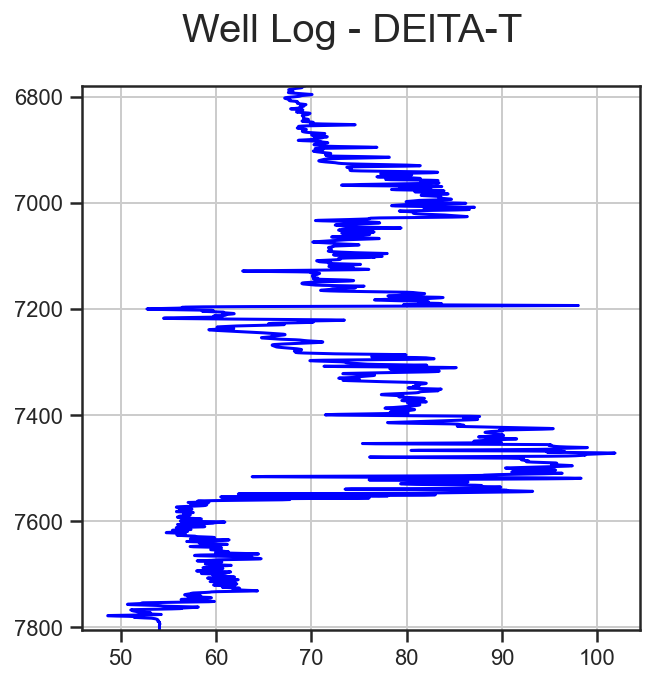

In [52]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - DElTA-T', size=20)

plt.subplot(1,1,1)
plt.plot(DTco, Depth, color='blue')
plt.ylim(max(Depth),min(Depth))
plt.grid()

plt.show()

### Drilling Data

In [53]:
drilling_data_subset = pd.read_csv('MIP3H Drilling Data.csv', header = 0)
drilling_data_subset.head()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
0,6850,88.51,6.915,16.7,37,354.4
1,6851,62.76,5.960,15.4,32,166.0
2,6852,56.92,8.597,16.1,32,178.7
3,6853,142.70,4.252,13.5,35,101.5
4,6854,142.87,9.054,13.6,32,44.1


In [54]:
drilling_data_subset.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,7044.000000,7044.000000,7044.000000,7044.000000,7044.000000,7044.000000
mean,10367.166809,189.018698,12.370597,26.556601,30.471749,187.944187
std,2029.687641,107.714113,3.521571,9.830599,11.367029,4177.729697
min,6850.000000,0.150000,0.033000,0.000000,2.000000,-999.250000
25%,8611.750000,150.110000,10.642000,24.000000,28.000000,85.900000
50%,10369.500000,209.245000,13.087000,28.300000,29.000000,96.400000
75%,12124.250000,236.245000,14.951000,30.500000,29.000000,113.700000
max,13879.000000,2940.600000,19.020000,101.400000,94.000000,330292.000000


### Matrix Scatter Plot

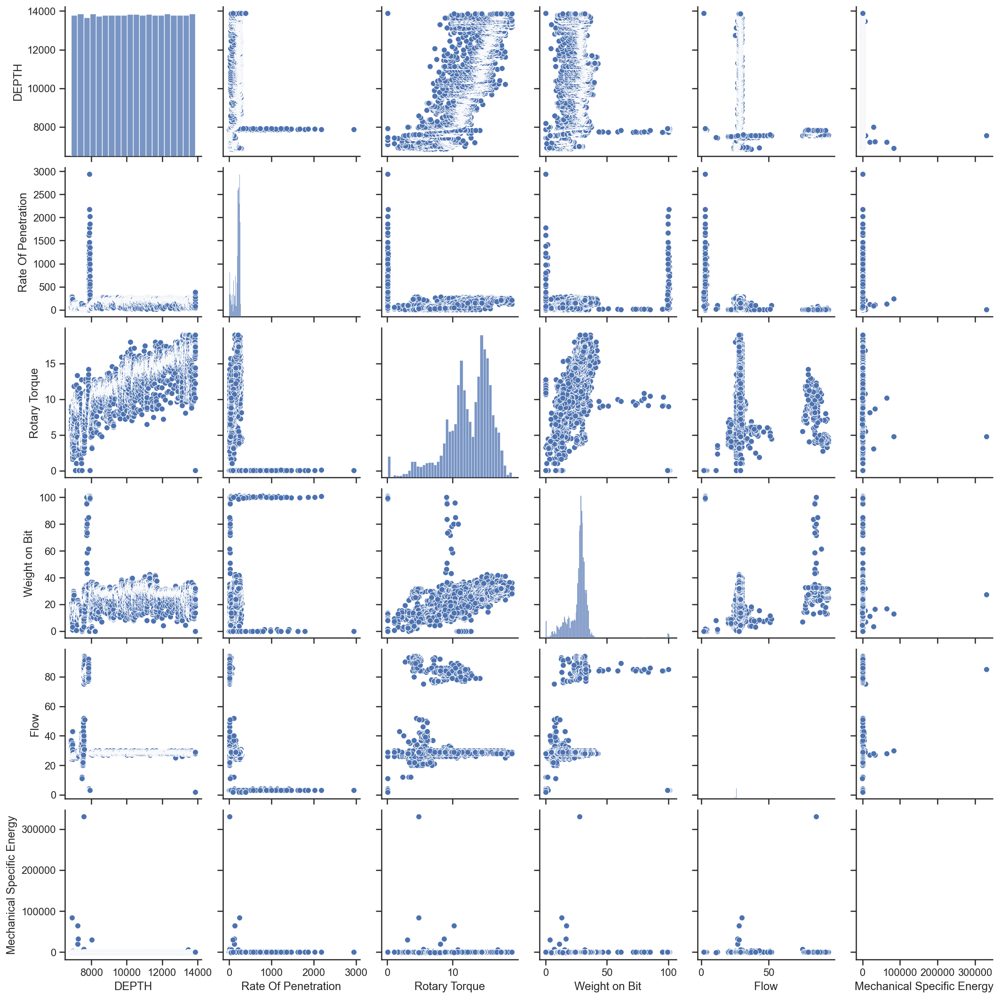

In [55]:
sns.set(style = 'ticks')
sns.pairplot(drilling_data_subset)

### Box Plots

<AxesSubplot:ylabel='Rate Of Penetration'>

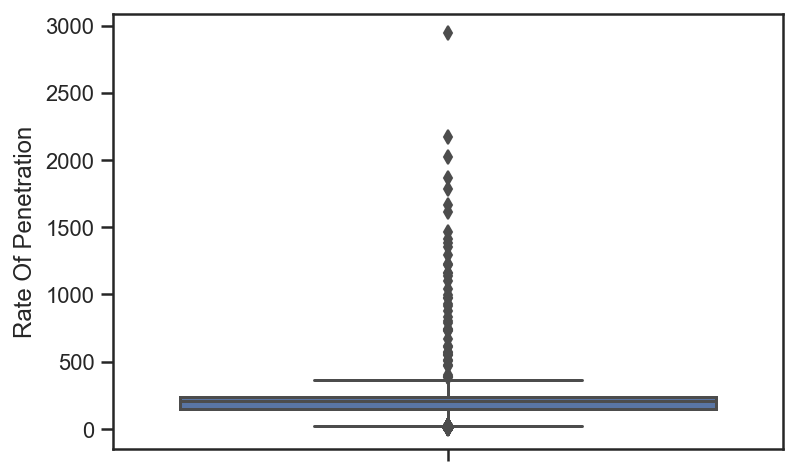

In [56]:
sns.boxplot(y = drilling_data_subset['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

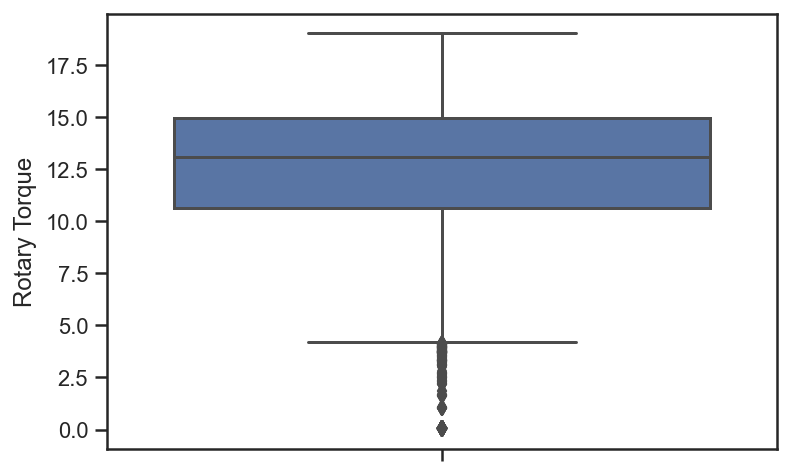

In [57]:
sns.boxplot(y = drilling_data_subset['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

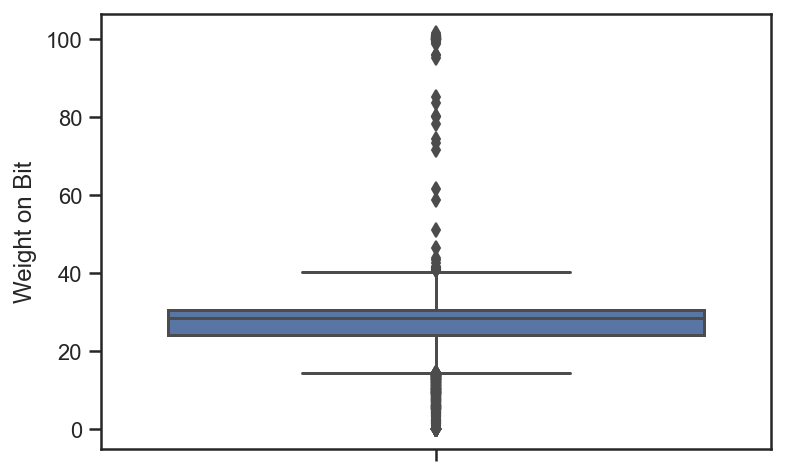

In [58]:
sns.boxplot(y = drilling_data_subset['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

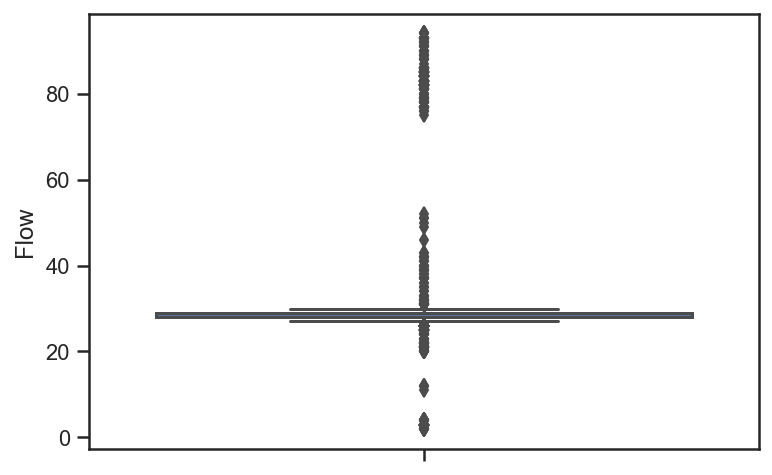

In [59]:
sns.boxplot(y = drilling_data_subset['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

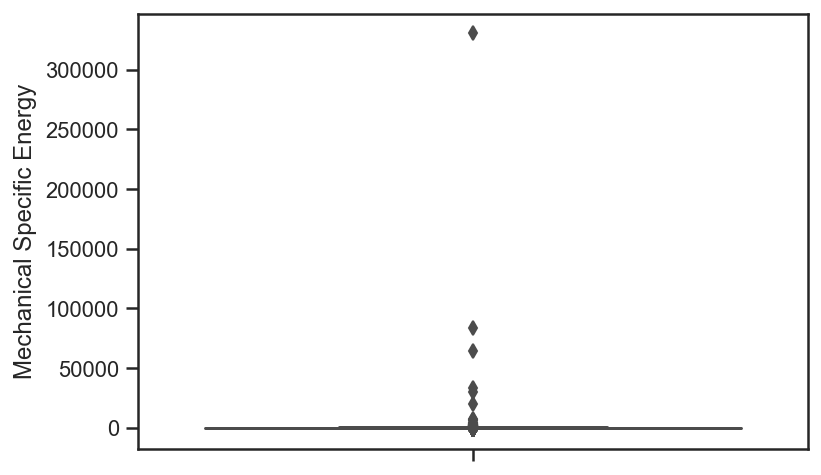

In [60]:
sns.boxplot(y = drilling_data_subset['Mechanical Specific Energy'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

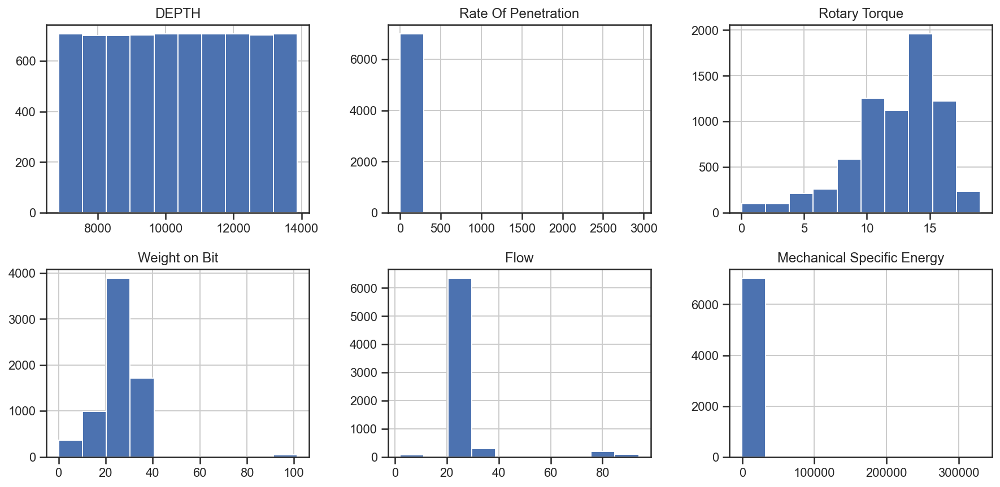

In [61]:
drilling_data_subset.hist(figsize = (15, 15), layout = (4,3))

### Removing Zero ROP, WOB and Negative MSE Values

In [62]:
drillingdata = drilling_data_subset[(drilling_data_subset['Rate Of Penetration'] > 0) & (drilling_data_subset['Weight on Bit'] > 0) &  (drilling_data_subset['Mechanical Specific Energy'] > 0)]
drillingdata.head()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
0,6850,88.51,6.915,16.7,37,354.4
1,6851,62.76,5.960,15.4,32,166.0
2,6852,56.92,8.597,16.1,32,178.7
3,6853,142.70,4.252,13.5,35,101.5
4,6854,142.87,9.054,13.6,32,44.1


In [63]:
drillingdata.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,6596.000000,6596.000000,6596.000000,6596.000000,6596.000000,6596.000000
mean,10506.424803,195.673096,12.636538,27.074378,28.767283,219.599439
std,1981.593868,87.513928,3.384345,9.116901,5.627316,4313.809105
min,6850.000000,2.760000,0.033000,0.300000,3.000000,1.700000
25%,8880.750000,177.767500,10.949000,25.400000,28.000000,88.000000
50%,10543.500000,212.230000,13.527000,28.500000,29.000000,97.700000
75%,12207.250000,237.940000,15.052000,30.600000,29.000000,115.700000
max,13874.000000,2173.500000,19.020000,101.400000,94.000000,330292.000000


### Missing Values

In [64]:
drillingdata.isna().sum() 

DEPTH                         0
Rate Of Penetration           0
Rotary Torque                 0
Weight on Bit                 0
Flow                          0
Mechanical Specific Energy    0
dtype: int64

### Removing Outliers

In [65]:
from scipy import stats

drilling_data_MIP = drillingdata[['DEPTH', 'Rate Of Penetration', 'Rotary Torque', 'Weight on Bit', 'Flow', 'Mechanical Specific Energy']]

drilling_data_MIP = drilling_data_MIP[(np.abs(stats.zscore(drilling_data_MIP)) < 3).all(axis=1)]

drillingdata = drillingdata.merge(drilling_data_MIP,on=['DEPTH','Rate Of Penetration', 'Rotary Torque',  'Weight on Bit', 'Flow', 'Mechanical Specific Energy'])

In [66]:
drilling_data_MIP.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy
count,6465.000000,6465.000000,6465.000000,6465.000000,6465.000000,6465.000000
mean,10565.452127,194.421918,12.845729,26.670131,28.524981,133.285197
std,1956.814967,60.516222,3.062441,6.658779,1.309725,197.449323
min,6850.000000,3.460000,2.525000,0.300000,12.000000,2.200000
25%,8980.000000,180.280000,11.066000,25.600000,28.000000,88.100000
50%,10607.000000,212.710000,13.617000,28.500000,29.000000,97.700000
75%,12240.000000,237.890000,15.086000,30.600000,29.000000,115.000000
max,13874.000000,291.980000,19.020000,42.600000,43.000000,6585.600000


### Matrix Scatter Plots, Box Plots and Histogram after removing Outliers and negative values

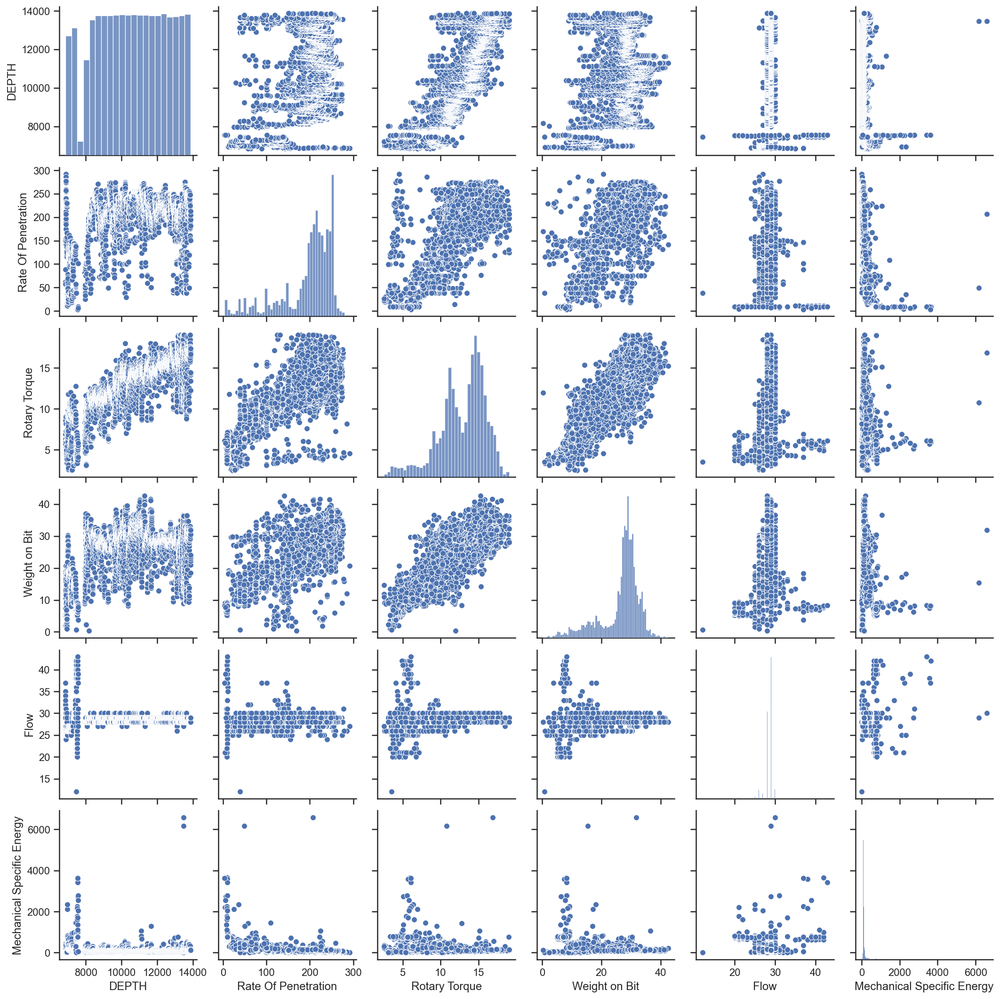

In [67]:
sns.set(style = 'ticks')
sns.pairplot(drilling_data_MIP)

<AxesSubplot:ylabel='Rate Of Penetration'>

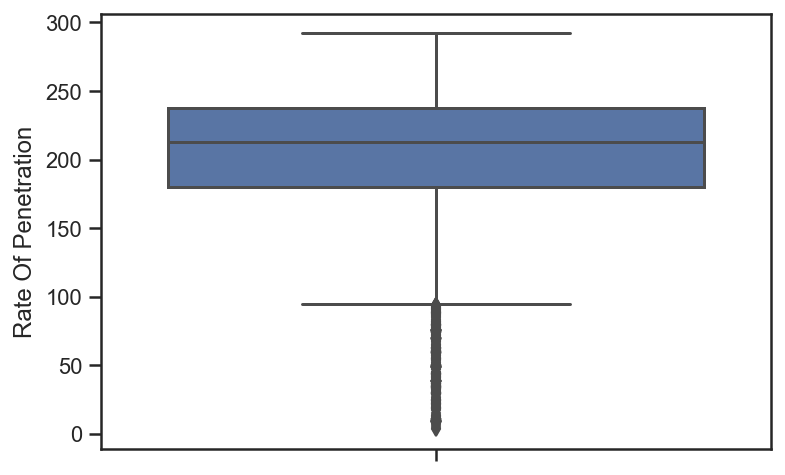

In [68]:
sns.boxplot(y = drilling_data_MIP['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

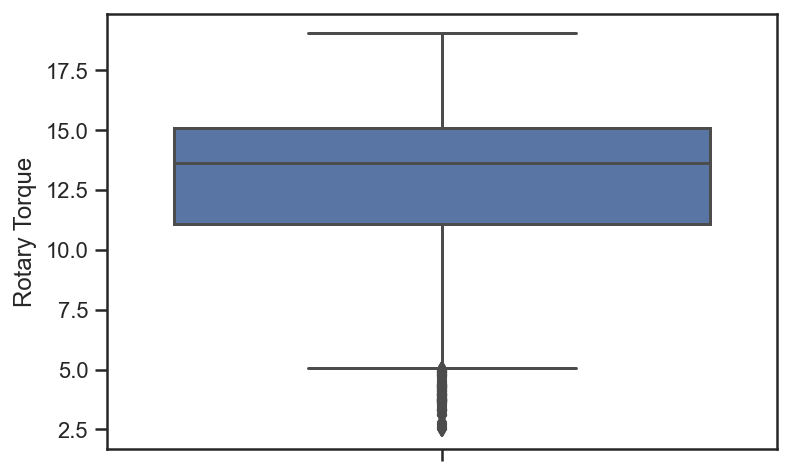

In [69]:
sns.boxplot(y = drilling_data_MIP['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

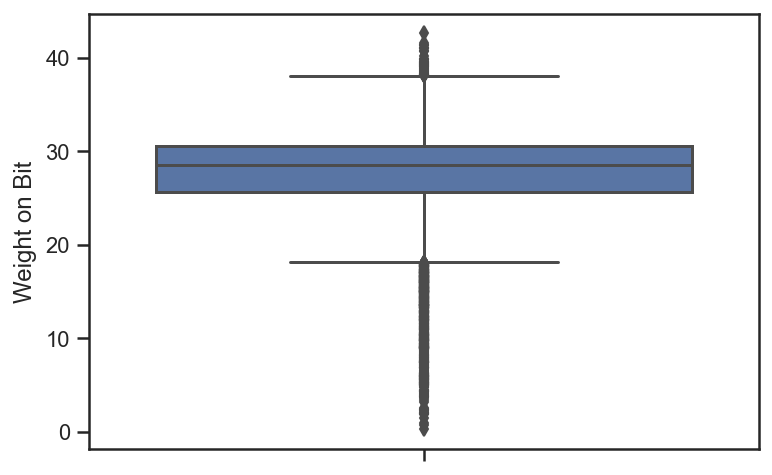

In [70]:
sns.boxplot(y = drilling_data_MIP['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

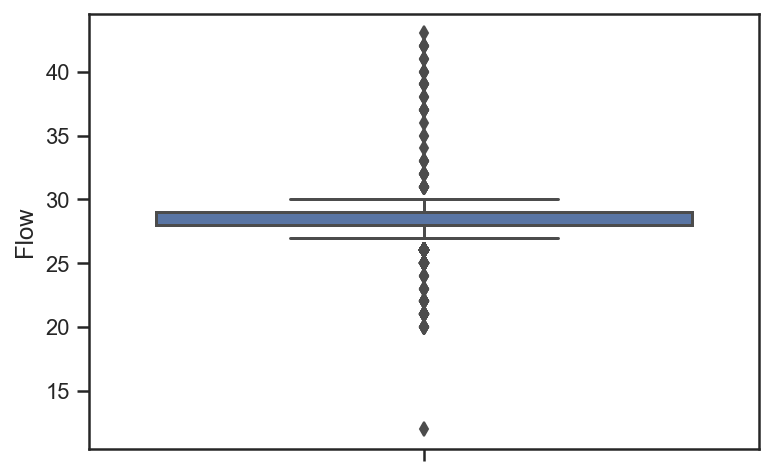

In [71]:
sns.boxplot(y = drilling_data_MIP['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

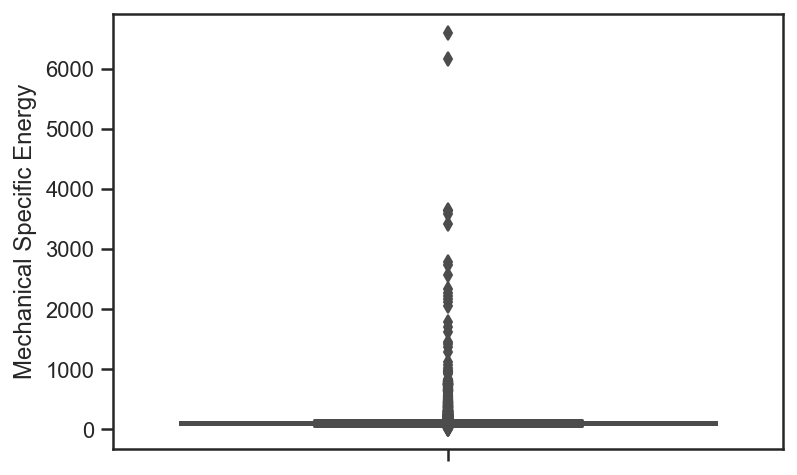

In [72]:
sns.boxplot(y = drilling_data_MIP['Mechanical Specific Energy'])

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

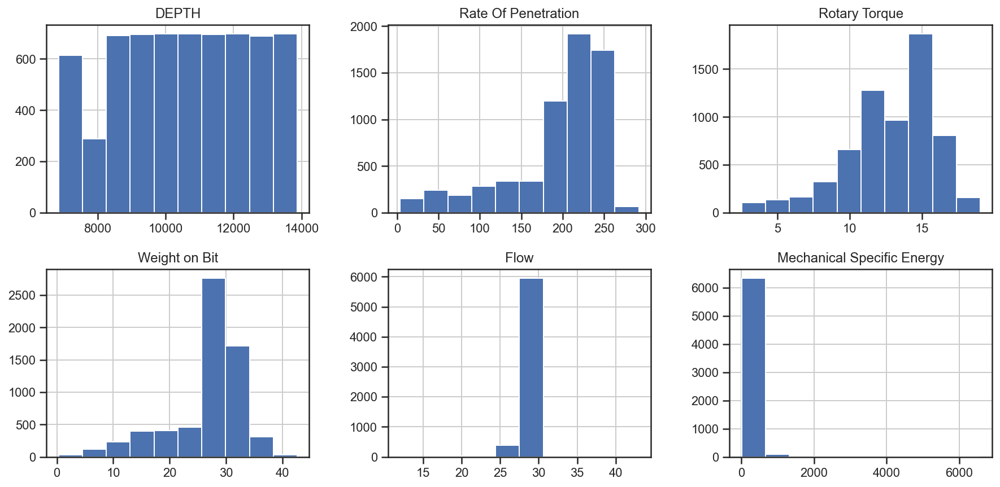

In [73]:
drilling_data_MIP.hist(figsize = (15, 15), layout = (4,3))

### Merged Drilling and NPHI Data

In [74]:
Data = pd.merge(left = drilling_data_MIP, right = DTCO_Data_MIP, left_on = 'DEPTH', right_on = 'DEPTH')
Data.head()

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:1123: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation
  warnings.warn(


,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy,DTCO
0,6850,88.51,6.915,16.7,37,354.4,69.89821
1,6851,62.76,5.960,15.4,32,166.0,70.28711
2,6852,56.92,8.597,16.1,32,178.7,72.56277
3,6853,142.70,4.252,13.5,35,101.5,74.60047
4,6854,142.87,9.054,13.6,32,44.1,72.40883


In [75]:
Data.describe()

,DEPTH,Rate Of Penetration,Rotary Torque,Weight on Bit,Flow,Mechanical Specific Energy,DTCO
count,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000,618.000000
mean,7213.606796,92.846392,7.274447,13.966990,27.412621,327.094660,77.677508
std,203.635465,60.014466,2.420948,5.899928,3.696725,454.932292,8.885594
min,6850.000000,3.460000,2.525000,0.700000,12.000000,2.200000,52.765130
25%,7048.250000,33.967500,4.885750,9.100000,26.000000,116.700000,71.207023
50%,7219.500000,108.870000,8.503500,15.000000,26.000000,156.950000,76.929965
75%,7388.750000,132.665000,9.214250,18.200000,29.000000,387.575000,82.825713
max,7558.000000,291.980000,12.771000,30.300000,43.000000,3649.800000,101.477470


In [76]:
Data.isna().sum()

DEPTH                         0
Rate Of Penetration           0
Rotary Torque                 0
Weight on Bit                 0
Flow                          0
Mechanical Specific Energy    0
DTCO                          0
dtype: int64

In [77]:
Data.dropna(how='any', inplace=True)
Data.isnull().sum().sum()

0

In [78]:
Depth = Data['DEPTH']
DTCo = Data['DTCO']

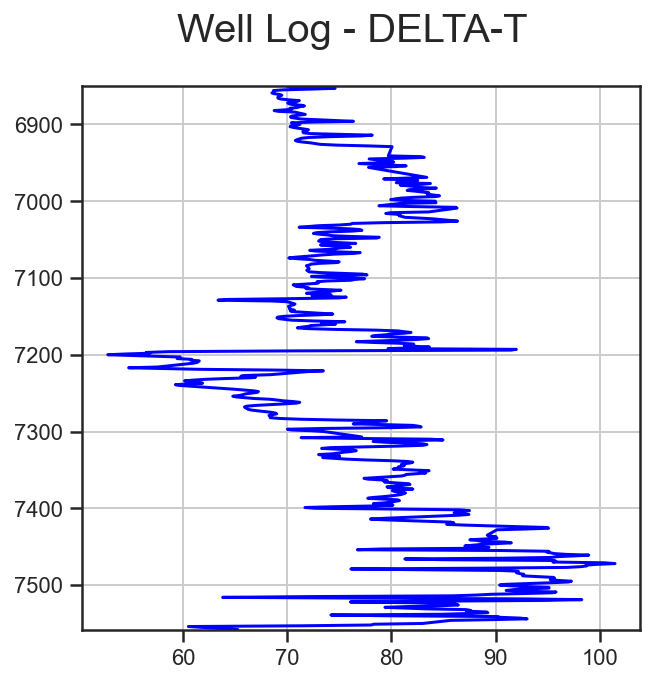

In [79]:
plt.figure(figsize=(5,5))

plt.suptitle('Well Log - DELTA-T', size=20)

plt.subplot(1,1,1)
plt.plot(DTCo, Depth, color='blue')
plt.ylim(max(Depth),min(Depth))
plt.grid()

plt.show()

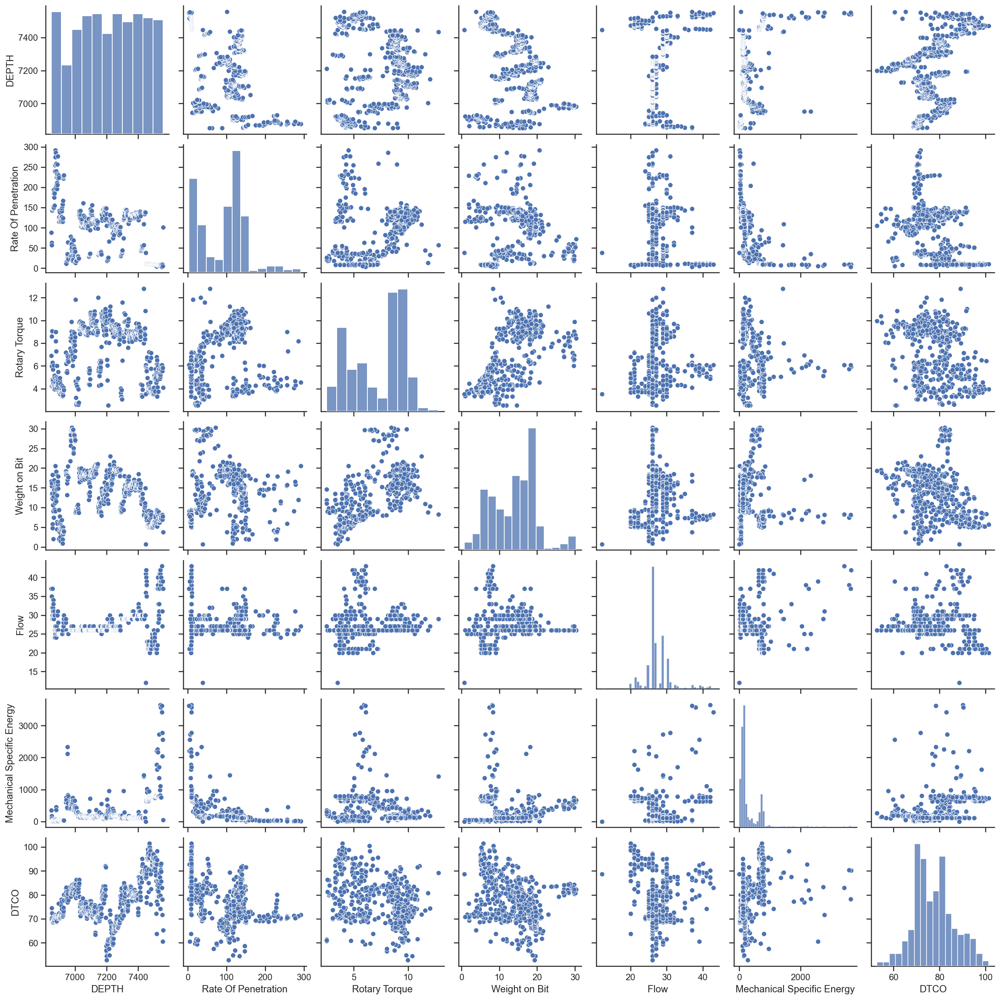

In [80]:
sns.set(style = 'ticks')
sns.pairplot(Data)

array([[<AxesSubplot:title={'center':'DEPTH'}>,
        <AxesSubplot:title={'center':'Rate Of Penetration'}>,
        <AxesSubplot:title={'center':'Rotary Torque'}>],
       [<AxesSubplot:title={'center':'Weight on Bit'}>,
        <AxesSubplot:title={'center':'Flow'}>,
        <AxesSubplot:title={'center':'Mechanical Specific Energy'}>],
       [<AxesSubplot:title={'center':'DTCO'}>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

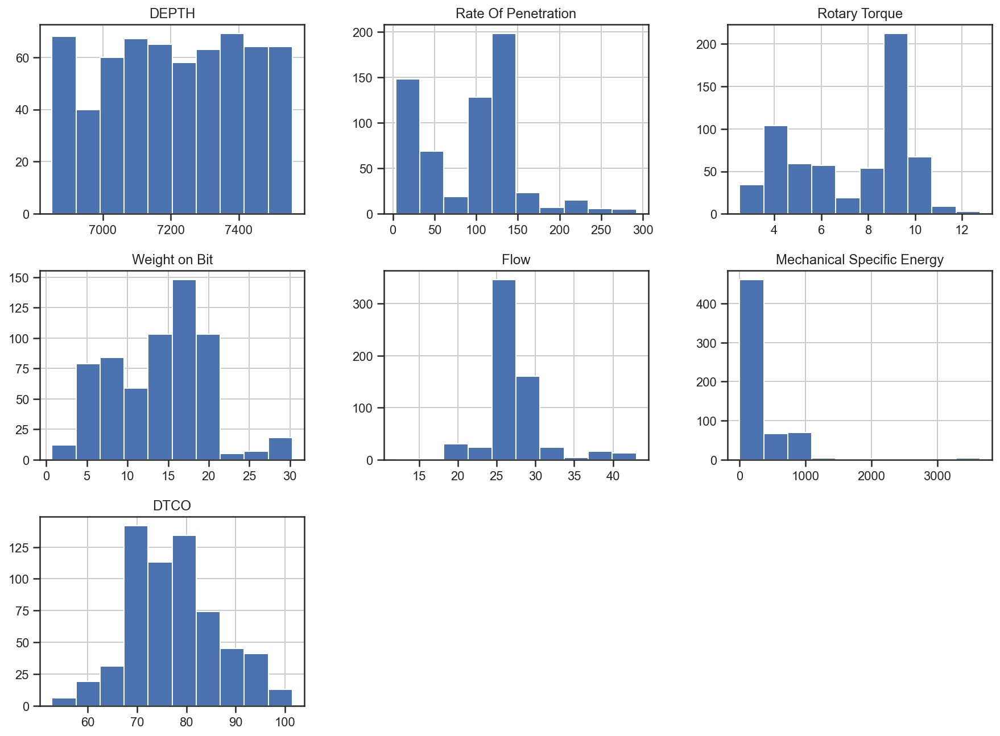

In [81]:
Data.hist(figsize = (15, 15), layout = (4,3))

<AxesSubplot:ylabel='Rate Of Penetration'>

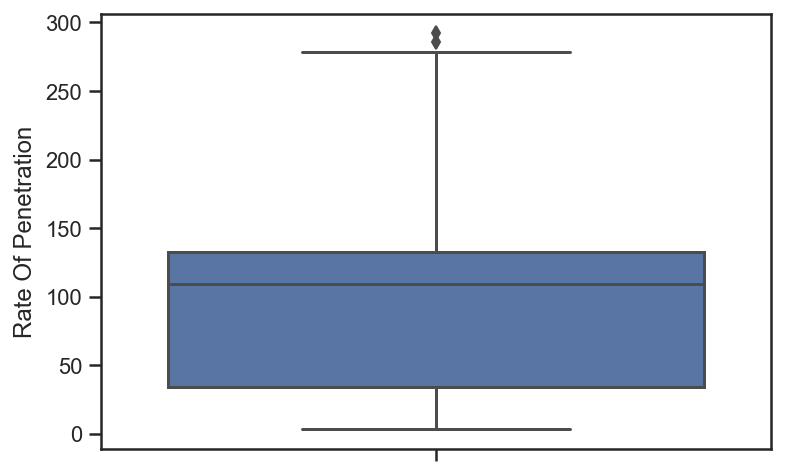

In [82]:
sns.boxplot(y = Data['Rate Of Penetration'])

<AxesSubplot:ylabel='Rotary Torque'>

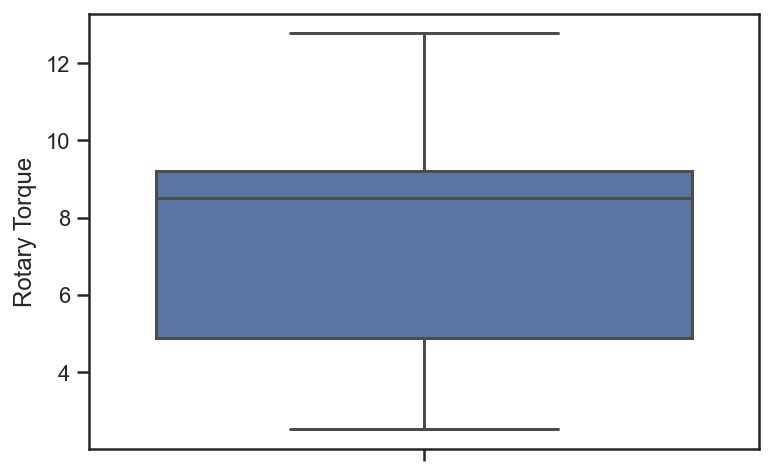

In [83]:
sns.boxplot(y = Data['Rotary Torque'])

<AxesSubplot:ylabel='Weight on Bit'>

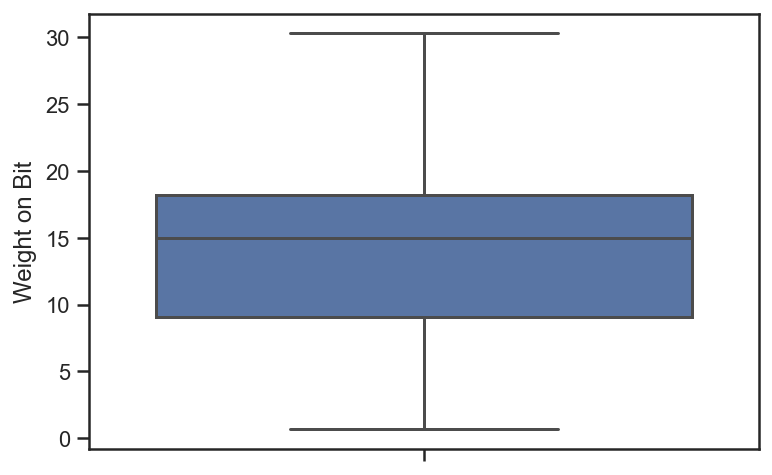

In [84]:
sns.boxplot(y = Data['Weight on Bit'])

<AxesSubplot:ylabel='Flow'>

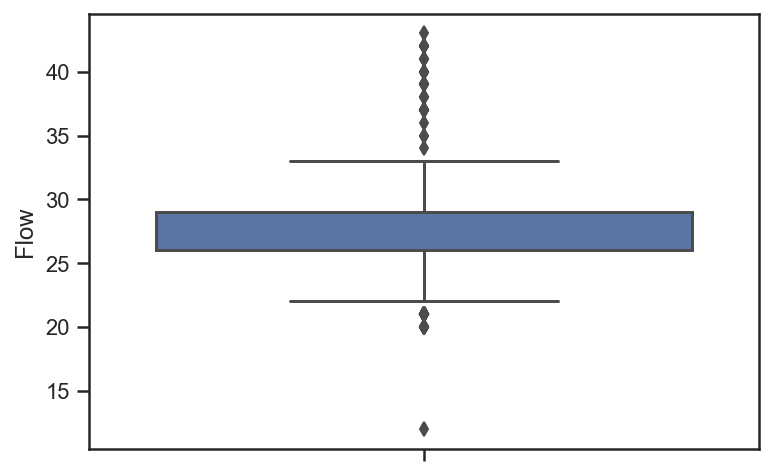

In [85]:
sns.boxplot(y = Data['Flow'])

<AxesSubplot:ylabel='Mechanical Specific Energy'>

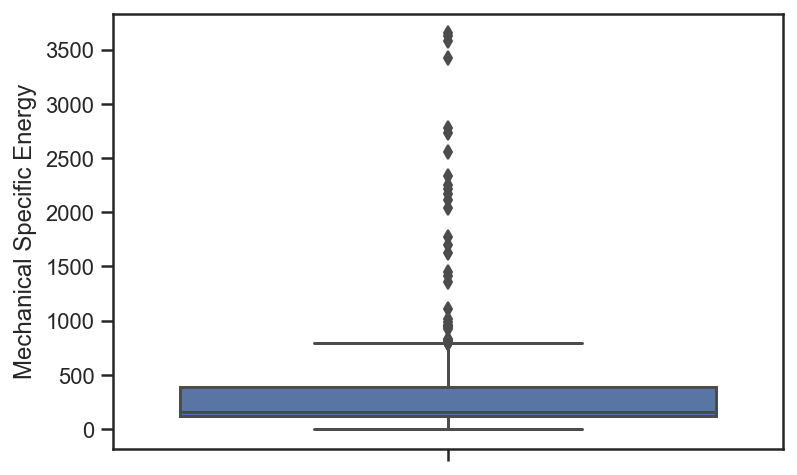

In [86]:
sns.boxplot(y = Data['Mechanical Specific Energy'])

<AxesSubplot:ylabel='DTCO'>

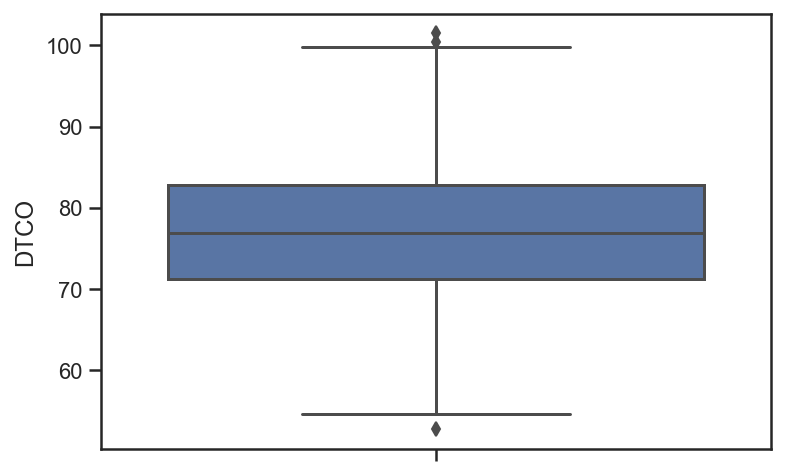

In [87]:
sns.boxplot(y = Data['DTCO'])

### Scaling the Data

In [88]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

# Scaling the input data
input_drillingdata = Data[['DEPTH', 'Rate Of Penetration','Rotary Torque', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow' ]].to_numpy()
drillingdata_scaled = scaler.fit_transform(input_drillingdata)
drillingdata_scaled_df = pd.DataFrame (drillingdata_scaled , columns = ['DEPTH','Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow'])

# Keeping the output data separate
DTCO_raw = Data[['DTCO']].to_numpy()
DTCO_raw_df = pd.DataFrame(DTCO_raw, columns = ['DTCO'])

drillingdata_scaled_df['DTCO'] = DTCO_raw_df

In [89]:
drillingdata_scaled_df.isnull().sum().sum()

0

### Train/Test Split

In [90]:
from sklearn.model_selection import train_test_split
train , test = train_test_split(drillingdata_scaled_df, test_size = 0.15, random_state = 12 )

In [91]:
x_train_1 = train.drop('DTCO', axis=1) 
y_train_1 = train['DTCO']              

x_test_1 = test.drop('DTCO', axis = 1) 
y_test_1 = test['DTCO']

In [92]:
print("TRAINING DATA")
print("Size of x_train_1 is:", x_train_1.shape)
print("Size of y_train_1 is:", y_train_1.shape)
print("TEST DATA")
print("Size of x_test_1 is:", x_test_1.shape)
print("Size of y_test_1 is:", y_test_1.shape)

TRAINING DATA
Size of x_train_1 is: (525, 6)
Size of y_train_1 is: (525,)
TEST DATA
Size of x_test_1 is: (93, 6)
Size of y_test_1 is: (93,)


### Random Forest Regression

In [93]:
x_train_rf = x_train_1.copy()
x_test_rf = x_test_1.copy()
y_train_rf = y_train_1.copy()
y_test_rf = y_test_1.copy()

In [94]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 

eps = 0.1
rfr= RandomForestRegressor(n_estimators=500, max_depth=10)

rfr.fit(x_train_rf, y_train_rf)

RandomForestRegressor(max_depth=10, n_estimators=500)

In [95]:
y_pred_rf = rfr.predict(x_test_rf)
test_R2 = rfr.score(x_test_rf, y_test_rf)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf - y_pred_rf  < eps) / len(y_test_rf)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.8060029020588664
Percentage within Epsilon = 52.69%


Text(0.5, 1.0, 'TestR2 = 0.806003')

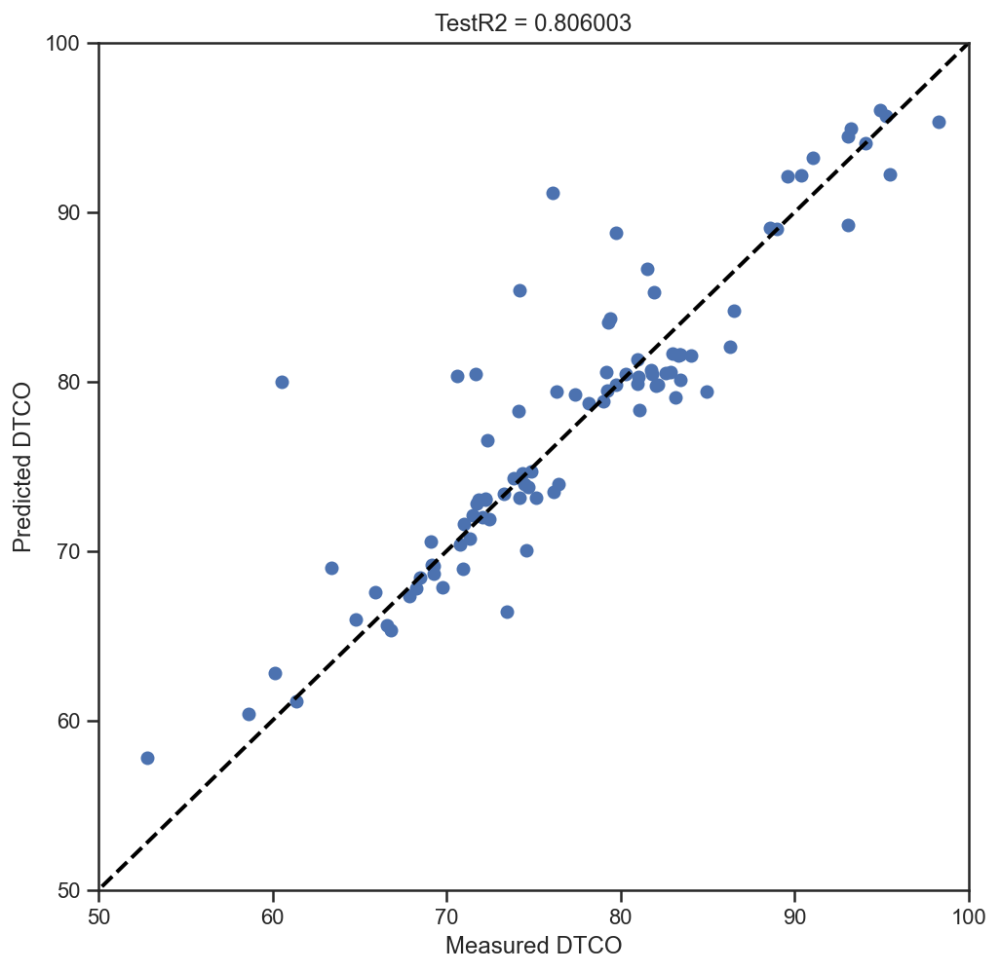

In [96]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_rf, y_pred_rf)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 
plt.title('TestR2 = %f'%(test_R2))

### Error and Accuracy: Random Forest

In [97]:
NPHI_RandomForest = pd.DataFrame({ 'Measured DTCO':y_test_rf, 'Predicted DTCO':y_pred_rf})
NPHI_RandomForest.head()


,Measured DTCO,Predicted DTCO
285,82.15353,79.817624
150,73.86228,74.291734
122,86.30408,82.068609
594,81.52559,86.682448
20,70.76566,70.364927


In [98]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf, y_pred_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf, y_pred_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)))

Mean Absolute Error: 2.4698421764828384
Mean Squared Error: 15.865789309620688
Root Mean Squared Error: 3.9831883346912793


In [99]:
# Calculate the absolute errors
errors = abs(y_pred_rf - y_test_rf)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 2.47 degrees.
Accuracy: 96.69 %.


### Variable Importance

In [100]:
# Get numerical feature importances
importances = list(rfr.feature_importances_)

In [101]:
feature_list=list(Data[['DEPTH','Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy', 'Flow']].columns)

feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: DEPTH                Importance: 0.84
Variable: Mechanical Specific Energy Importance: 0.06
Variable: Rate Of Penetration  Importance: 0.03
Variable: Flow                 Importance: 0.03
Variable: Weight on Bit        Importance: 0.02
Variable: Rotary Torque        Importance: 0.02


<AxesSubplot:xlabel='Importance', ylabel='Features'>

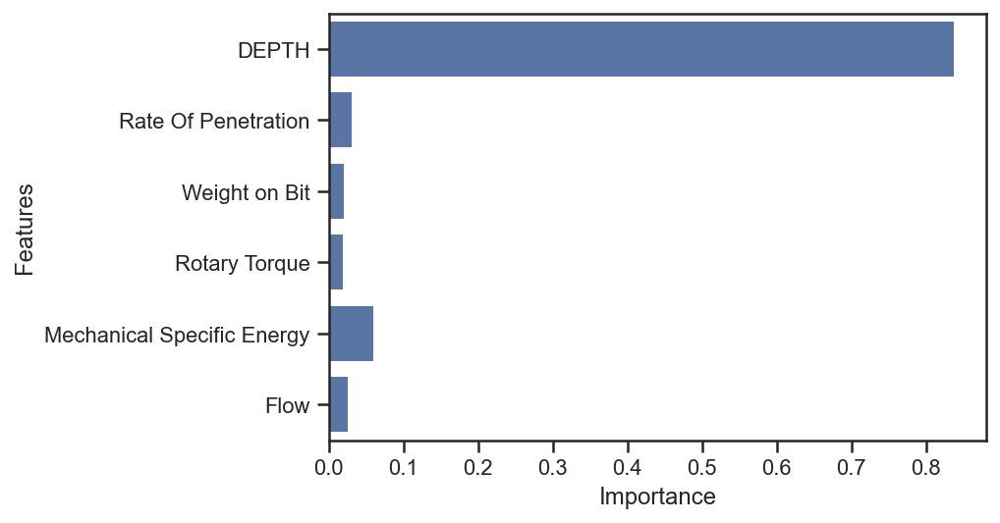

In [102]:
feature_dataframe = pd.DataFrame(data = feature_list, columns = ['Features'])
feature_dataframe['Importance'] = importances

sns.set(style = 'ticks')
sns.barplot(x = 'Importance', y = 'Features', data = feature_dataframe, color="b")


### Scaling the Data: Removing Depth and Flow

In [103]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0, 1))

# Scaling the input data
input_drillingdata = Data[['Rate Of Penetration','Weight on Bit', 'Rotary Torque', 'Mechanical Specific Energy']].to_numpy()
drillingdata_scaled = scaler.fit_transform(input_drillingdata)
drillingdata_scaled_df = pd.DataFrame (drillingdata_scaled , columns = ['Rate Of Penetration', 'Weight on Bit', 'Rotary Torque','Mechanical Specific Energy'])

# Keeping the output data separate
DTCO_raw = Data[['DTCO']].to_numpy()
DTCO_raw_df = pd.DataFrame(DTCO_raw, columns = ['DTCO'])

drillingdata_scaled_df['DTCO'] = DTCO_raw_df

In [104]:
drillingdata_scaled_df.isnull().sum().sum()

0

### New Train/Test Split

In [105]:
from sklearn.model_selection import train_test_split
train , test = train_test_split(drillingdata_scaled_df, test_size = 0.15, random_state = 12 )

In [106]:
x_train = train.drop('DTCO', axis=1) 
y_train = train['DTCO']              

x_test = test.drop('DTCO', axis = 1) 
y_test = test['DTCO']

In [107]:
print("TRAINING DATA")
print("Size of x_train is:", x_train.shape)
print("Size of y_train is:", y_train.shape)
print("TEST DATA")
print("Size of x_test is:", x_test.shape)
print("Size of y_test is:", y_test.shape)

TRAINING DATA
Size of x_train is: (525, 4)
Size of y_train is: (525,)
TEST DATA
Size of x_test is: (93, 4)
Size of y_test is: (93,)


### Random Forest Regression

In [108]:
x_train_rf = x_train.copy()
x_test_rf = x_test.copy()
y_train_rf = y_train.copy()
y_test_rf = y_test.copy()

In [109]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error 

eps = 0.1
rfr= RandomForestRegressor(n_estimators=500, max_depth=10)

rfr.fit(x_train_rf, y_train_rf)

RandomForestRegressor(max_depth=10, n_estimators=500)

In [110]:
y_pred_rf = rfr.predict(x_test_rf)
test_R2 = rfr.score(x_test_rf, y_test_rf)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf - y_pred_rf  < eps) / len(y_test_rf)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.5681462366898478
Percentage within Epsilon = 54.84%


Text(0.5, 1.0, 'TestR2 = 0.501233')

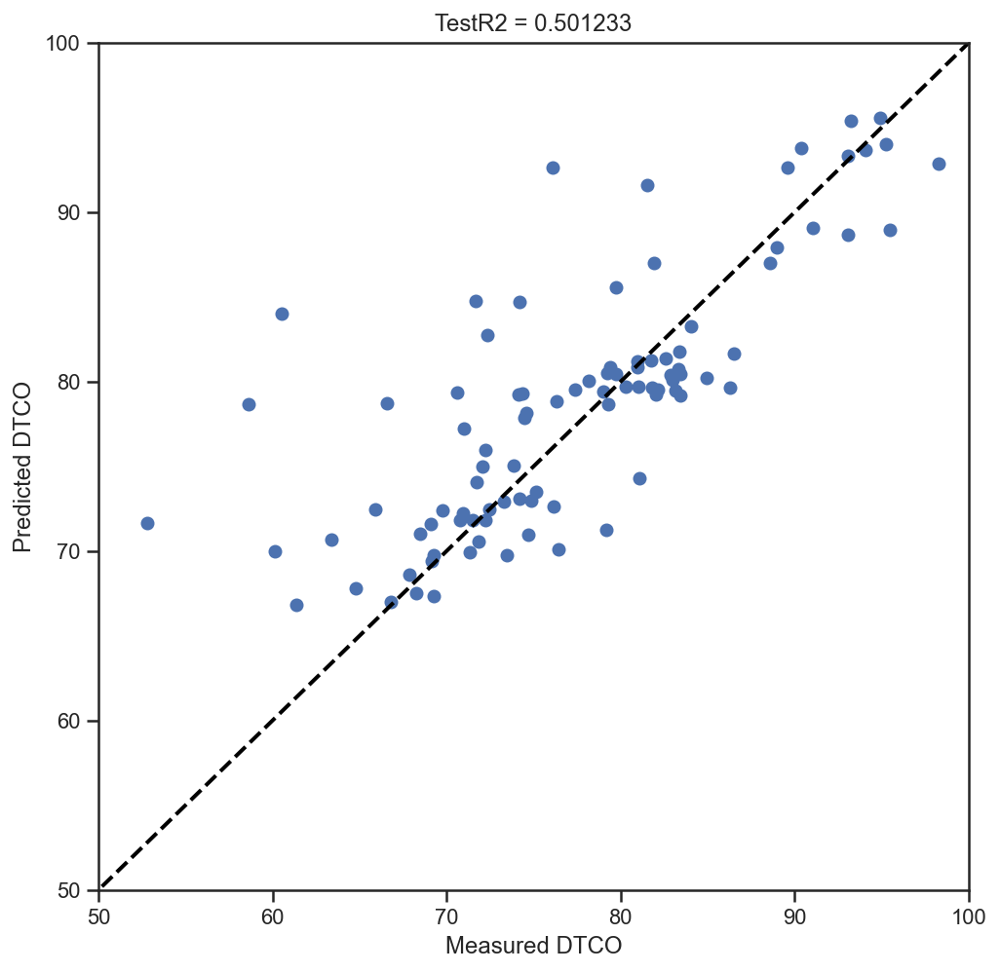

In [183]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_rf, y_pred_rf)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 
plt.title('TestR2 = %f'%(test_R2))

### Error and Accuracy: Random Forest

In [112]:
NPHI_RandomForest = pd.DataFrame({ 'Measured DTCO':y_test_rf, 'Predicted DTCO':y_pred_rf})
NPHI_RandomForest.head()

,Measured DTCO,Predicted DTCO
285,82.15353,79.502269
150,73.86228,75.031293
122,86.30408,79.648000
594,81.52559,91.616913
20,70.76566,71.815358


In [113]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf, y_pred_rf))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf, y_pred_rf))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rf)))

Mean Absolute Error: 3.951341143884875
Mean Squared Error: 35.31857380322643
Root Mean Squared Error: 5.942943193673185


In [114]:
# Calculate the absolute errors
errors = abs(y_pred_rf - y_test_rf)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 3.95 degrees.
Accuracy: 94.5 %.


### Hyperparameter optimization for the RF

In [115]:
from sklearn.model_selection import KFold

cv = KFold(n_splits=10, shuffle = True, random_state=125)

In [116]:
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators': [200, 500, 1000, 2000], 'max_depth': [3,4,5,6], 'min_samples_split': [5,10,15]} # dictionary with keys

grid = GridSearchCV(rfr, param_grid=param_grid, cv=cv, verbose=3) 

In [117]:
grid.fit(x_train_rf, y_train_rf)

Fitting 10 folds for each of 48 candidates, totalling 480 fits
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.543, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.432, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.469, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s


[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.521, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.641, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.423, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.670, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.437, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=0.628, total=   0.2s
[CV] max_depth=3, min_samples_split=5, n_estimators=200 ..............
[CV]  max_depth=3, min_samples_split=5, n_estimators=200, score=

[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.665, total=   0.4s
[CV] max_depth=3, min_samples_split=10, n_estimators=500 .............
[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.443, total=   0.4s
[CV] max_depth=3, min_samples_split=10, n_estimators=500 .............
[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.619, total=   0.4s
[CV] max_depth=3, min_samples_split=10, n_estimators=500 .............
[CV]  max_depth=3, min_samples_split=10, n_estimators=500, score=0.376, total=   0.4s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=1000, score=0.546, total=   0.8s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=1000, score=0.430, total=   0.8s
[CV] max_depth=3, min_samples_split=10, n_estimators=1000 ............
[CV]  max_depth=3, min_samples_split=10, n_estimators=10

[CV]  max_depth=3, min_samples_split=15, n_estimators=1000, score=0.383, total=   0.8s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.544, total=   1.6s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.435, total=   1.6s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.477, total=   1.6s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.518, total=   1.6s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimators=2000, score=0.642, total=   1.6s
[CV] max_depth=3, min_samples_split=15, n_estimators=2000 ............
[CV]  max_depth=3, min_samples_split=15, n_estimator

[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.537, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.652, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.471, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.684, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.461, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200, score=0.648, total=   0.2s
[CV] max_depth=4, min_samples_split=10, n_estimators=200 .............
[CV]  max_depth=4, min_samples_split=10, n_estimators=200,

[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.682, total=   0.4s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.469, total=   0.4s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.647, total=   0.4s
[CV] max_depth=4, min_samples_split=15, n_estimators=500 .............
[CV]  max_depth=4, min_samples_split=15, n_estimators=500, score=0.445, total=   0.4s
[CV] max_depth=4, min_samples_split=15, n_estimators=1000 ............
[CV]  max_depth=4, min_samples_split=15, n_estimators=1000, score=0.603, total=   0.9s
[CV] max_depth=4, min_samples_split=15, n_estimators=1000 ............
[CV]  max_depth=4, min_samples_split=15, n_estimators=1000, score=0.492, total=   0.9s
[CV] max_depth=4, min_samples_split=15, n_estimators=1000 ............
[CV]  max_depth=4, min_samples_split=15, n_estimators=10

[CV]  max_depth=5, min_samples_split=5, n_estimators=1000, score=0.495, total=   0.9s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000, score=0.672, total=   1.9s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000, score=0.532, total=   1.9s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000, score=0.542, total=   1.9s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000, score=0.564, total=   1.9s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000, score=0.663, total=   1.9s
[CV] max_depth=5, min_samples_split=5, n_estimators=2000 .............
[CV]  max_depth=5, min_samples_split=5, n_estimators=2000,

[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.565, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.654, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.519, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.683, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.463, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200, score=0.661, total=   0.2s
[CV] max_depth=5, min_samples_split=15, n_estimators=200 .............
[CV]  max_depth=5, min_samples_split=15, n_estimators=200,

[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.688, total=   0.5s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.448, total=   0.5s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.686, total=   0.5s
[CV] max_depth=6, min_samples_split=5, n_estimators=500 ..............
[CV]  max_depth=6, min_samples_split=5, n_estimators=500, score=0.554, total=   0.5s
[CV] max_depth=6, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=6, min_samples_split=5, n_estimators=1000, score=0.714, total=   1.0s
[CV] max_depth=6, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=6, min_samples_split=5, n_estimators=1000, score=0.557, total=   1.0s
[CV] max_depth=6, min_samples_split=5, n_estimators=1000 .............
[CV]  max_depth=6, min_samples_split=5, n_estimators=1000, sco

[CV]  max_depth=6, min_samples_split=10, n_estimators=1000, score=0.552, total=   1.0s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=2000, score=0.714, total=   1.9s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=2000, score=0.545, total=   1.9s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=2000, score=0.565, total=   1.9s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=2000, score=0.572, total=   1.9s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimators=2000, score=0.667, total=   1.9s
[CV] max_depth=6, min_samples_split=10, n_estimators=2000 ............
[CV]  max_depth=6, min_samples_split=10, n_estimator

[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:  6.6min finished


GridSearchCV(cv=KFold(n_splits=10, random_state=125, shuffle=True),
             estimator=RandomForestRegressor(max_depth=10, n_estimators=500),
             param_grid={'max_depth': [3, 4, 5, 6],
                         'min_samples_split': [5, 10, 15],
                         'n_estimators': [200, 500, 1000, 2000]},
             verbose=3)

In [118]:
print(grid.best_params_) 
print("score", grid.score(x_test_rf,y_test_rf)) 

{'max_depth': 6, 'min_samples_split': 5, 'n_estimators': 200}
score 0.5331573548634141


In [119]:
import pandas as pd

cv_results = pd.DataFrame(grid.cv_results_)

# generate a subset of the table
cv_results_tiny = cv_results[['param_max_depth', 'param_min_samples_split', 'mean_test_score','std_test_score']]

# rank them based on test scores
cv_results_tiny.sort_values(by='mean_test_score', ascending=False).head(5)

,param_max_depth,param_min_samples_split,mean_test_score,std_test_score
36,6,5,0.602455,0.079106
39,6,5,0.601861,0.080301
37,6,5,0.601348,0.081457
44,6,15,0.600546,0.079872
38,6,5,0.600149,0.079213


## Reapply the RF with optimal parameters again

In [120]:
grid_new=grid.best_estimator_

In [121]:
print('memorization performance: ', grid_new.score(x_train_rf,y_train_rf)) # memorization

print('generalization performance: ', grid_new.score(x_test_rf,y_test_rf))  # generalization

memorization performance:  0.8058110453615386
generalization performance:  0.5331573548634141


In [122]:
y_pred_rfop = grid_new.predict(x_test_rf)

In [180]:
y_pred_rfop = rfr.predict(x_test_rf)
test_R2 = rfr.score(x_test_rf, y_test_rf)
print("R2 = ", test_R2)
    
perc_within_eps = 100*np.sum(y_test_rf - y_pred_rfop  < eps) / len(y_test_rf)
print("Percentage within Epsilon = {:,.2f}%".format(perc_within_eps))

R2 =  0.5681462366898478
Percentage within Epsilon = 54.84%


Text(0.5, 1.0, 'TestR2 = 0.568146')

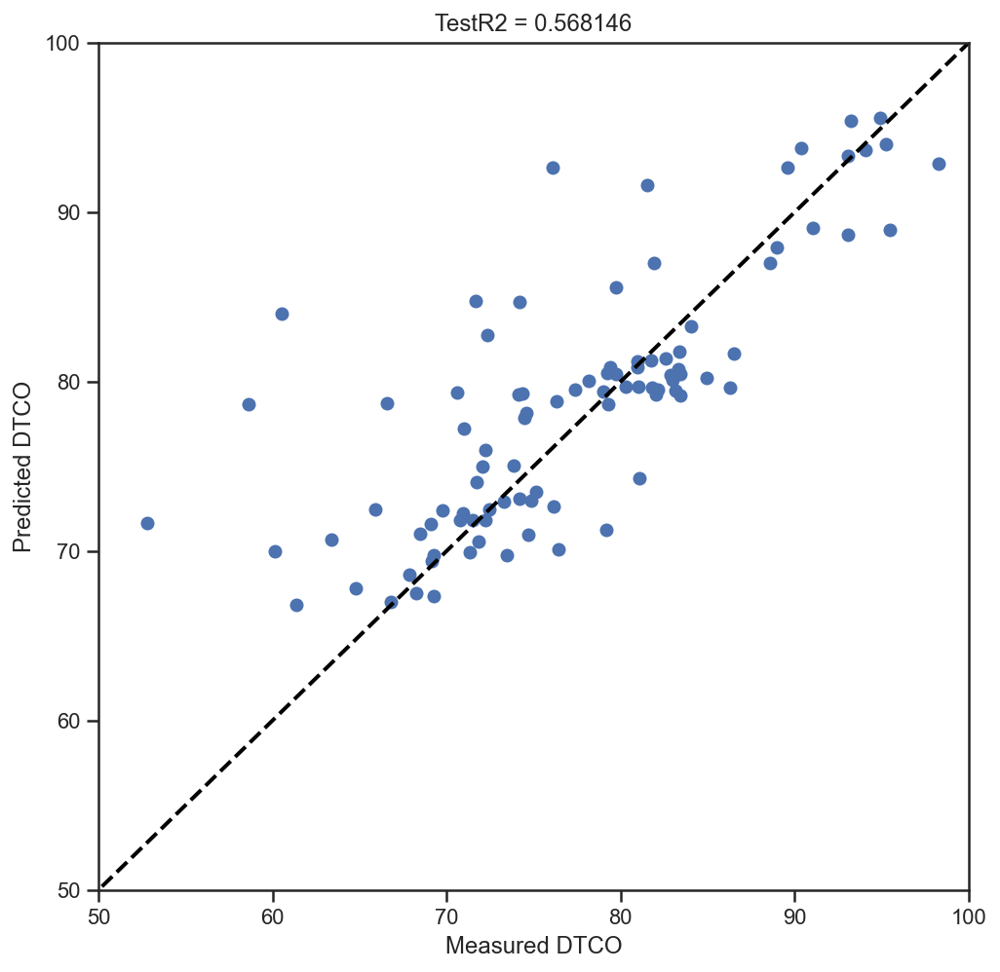

In [181]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_rf, y_pred_rfop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 
plt.title('TestR2 = %f'%(test_R2))

In [124]:
NPHI_RandomForest_OP = pd.DataFrame({'Measured DTCO':y_test_rf, 'Predicted DTCO':y_pred_rfop})
NPHI_RandomForest_OP.head()

,Measured DTCO,Predicted DTCO
285,82.15353,80.206689
150,73.86228,73.196788
122,86.30408,77.021607
594,81.52559,91.057921
20,70.76566,72.179090


In [125]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_rf, y_pred_rfop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_rf, y_pred_rfop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_rf, y_pred_rfop)))

Mean Absolute Error: 4.191966373218586
Mean Squared Error: 38.180092006998024
Root Mean Squared Error: 6.179004127446269


In [126]:
# Calculate the absolute errors
errors = abs(y_pred_rfop - y_test_rf)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_rf)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 4.19 degrees.
Accuracy: 94.19 %.


### KNN Regression with K Neighbors

In [127]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

from sklearn import neighbors
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [128]:
x_train_knn = x_train.copy()
x_test_knn = x_test.copy()
y_train_knn = y_train.copy()
y_test_knn = y_test.copy()

<ipython-input-129-93172d7391aa>:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(K, figsize=(6, 6))


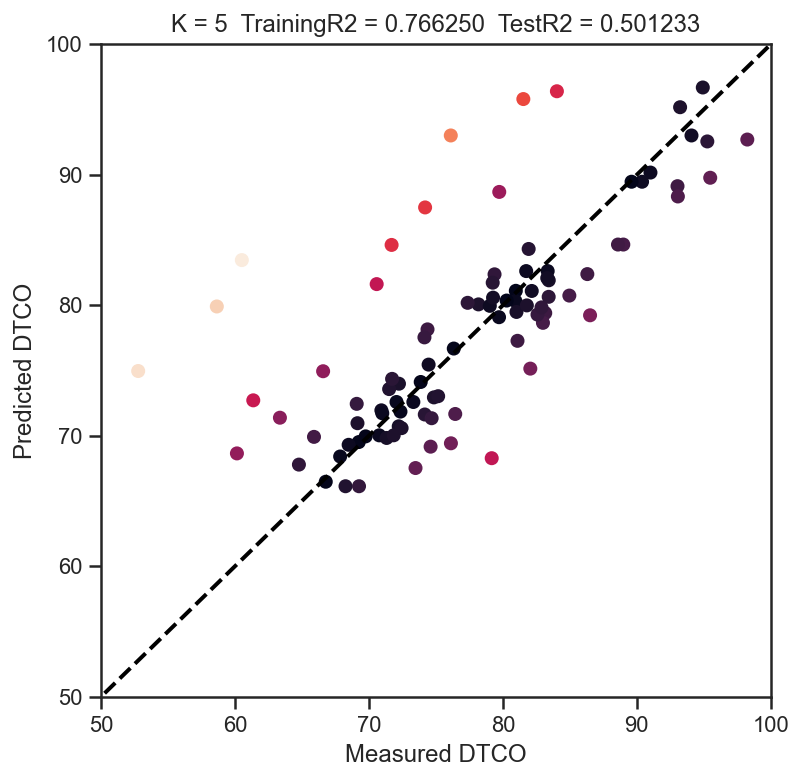

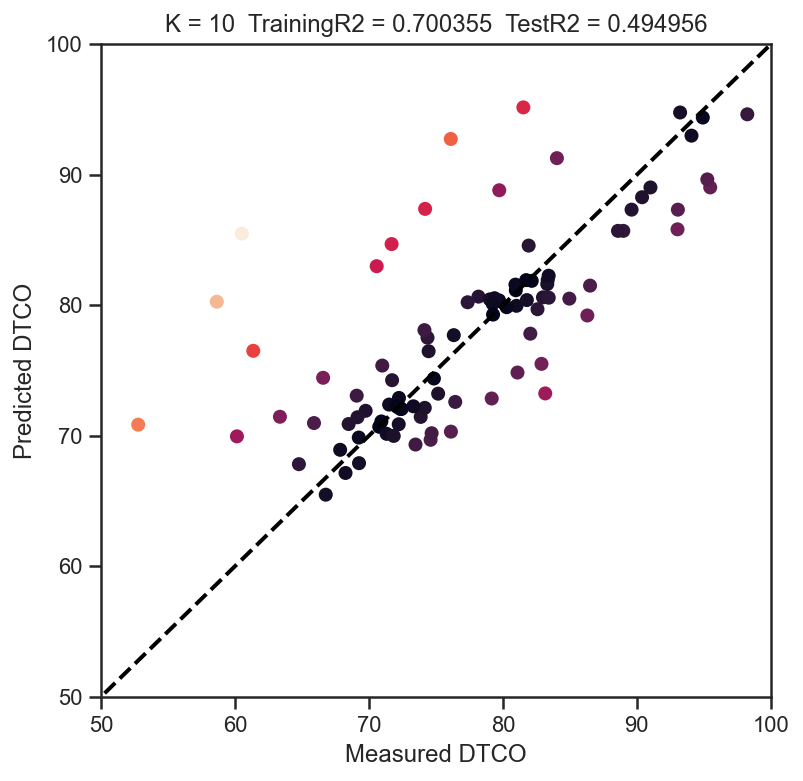

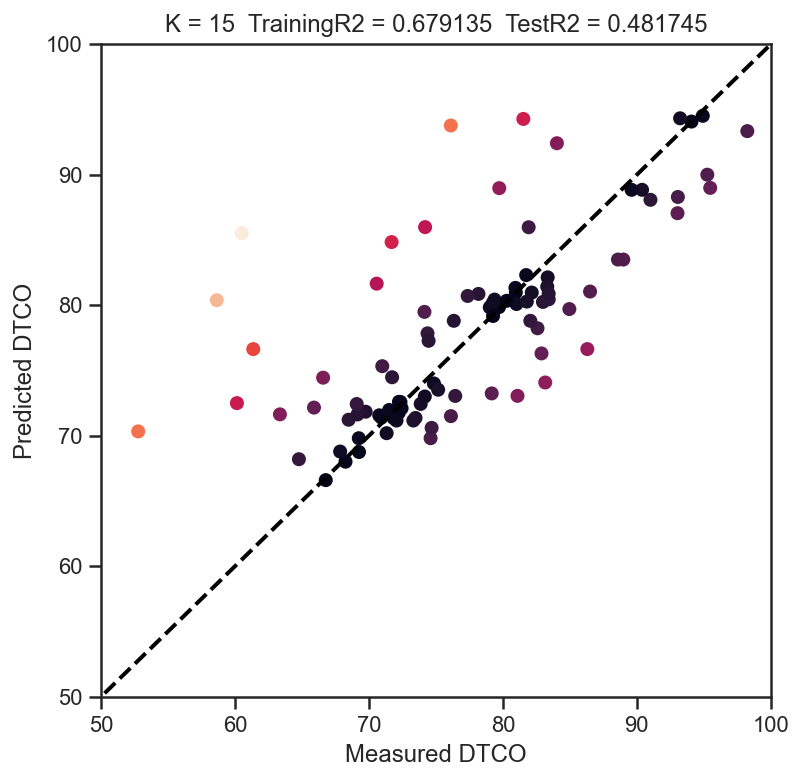

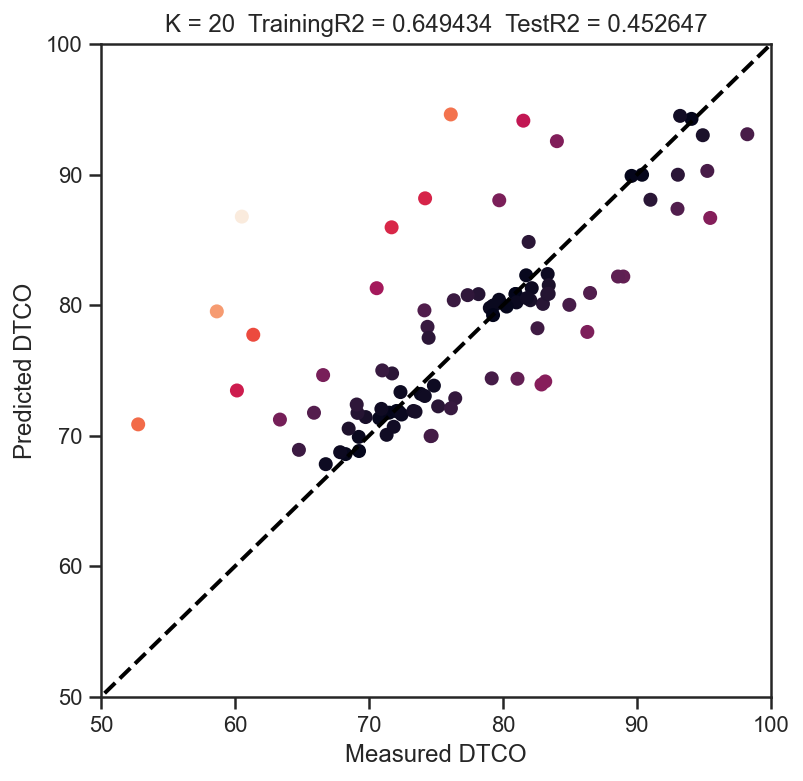

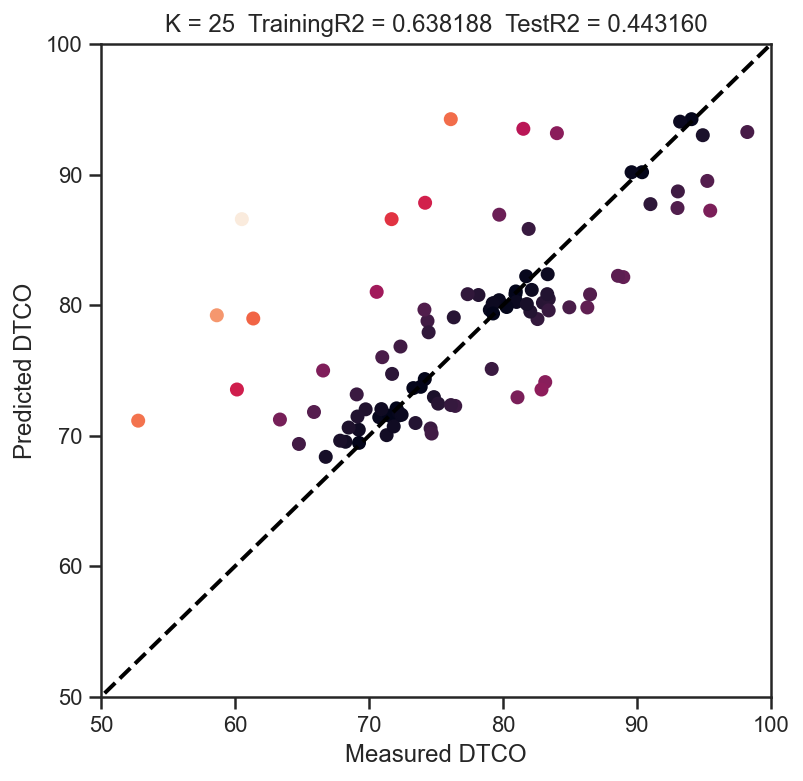

...

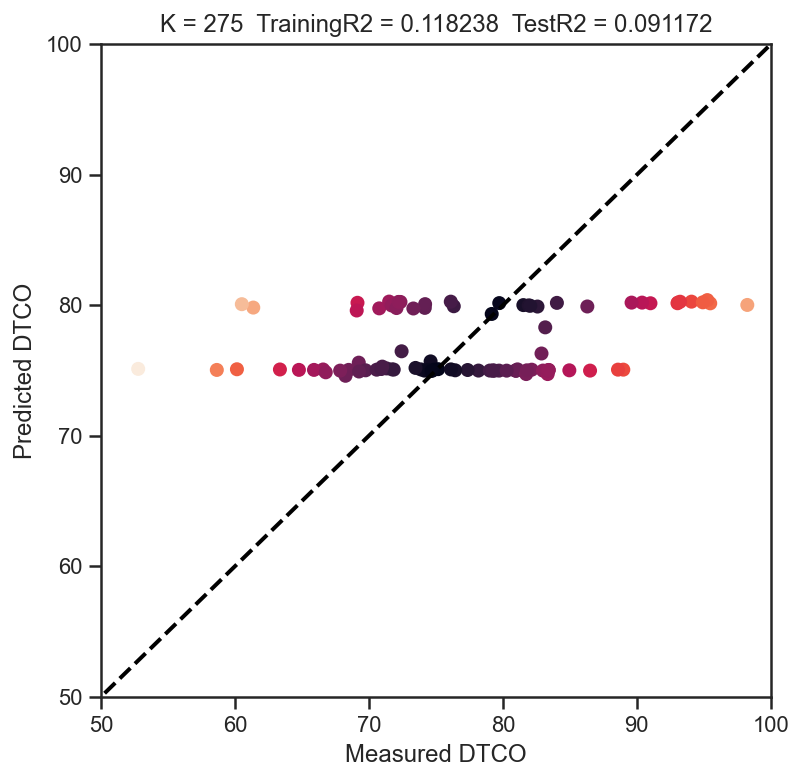

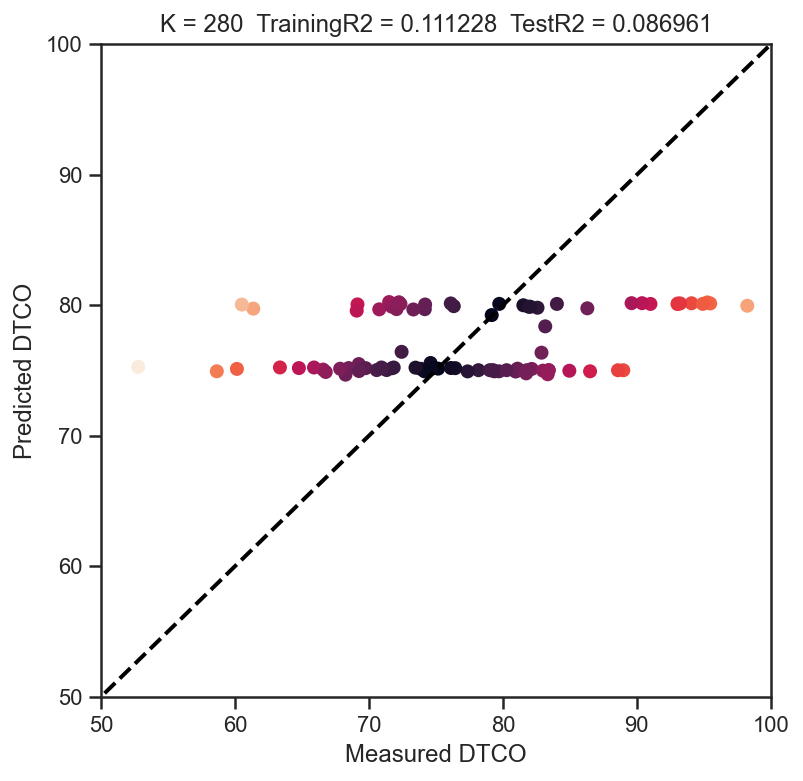

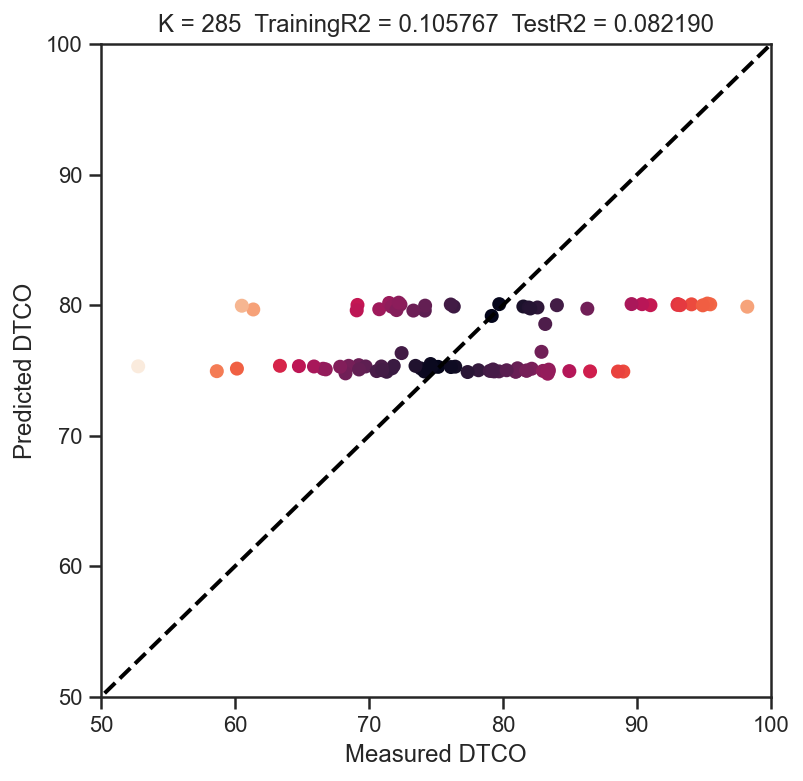

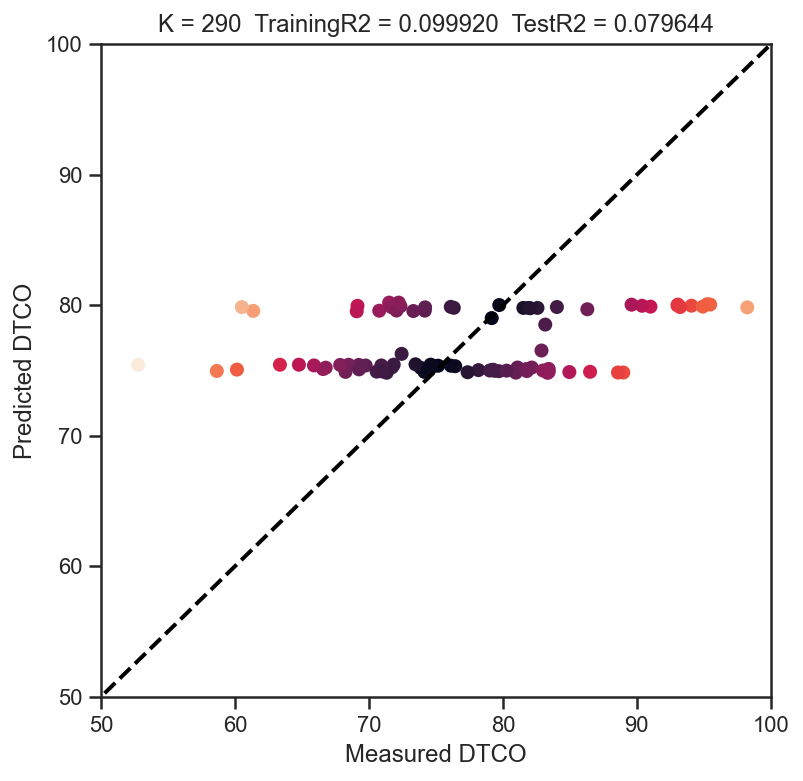

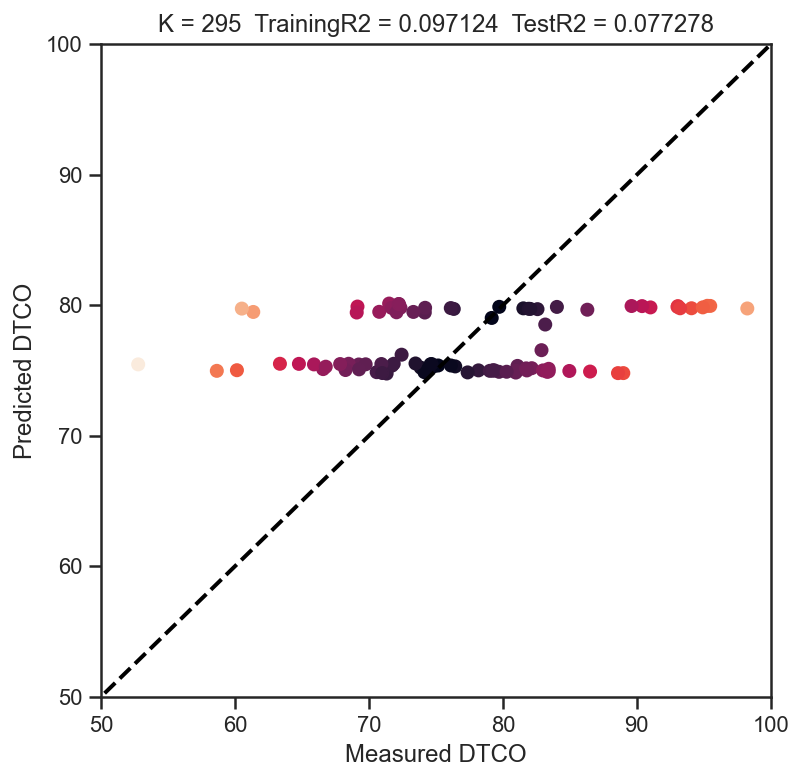

In [129]:
#import required packages
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 
from math import sqrt


rmse_val = [] # To store rmse values for different k
k_val = []    # To store values of K
R2 = []       # To store R2

for K in range(5, 300, 5):

    k_val.append(K)
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(x_train_knn, y_train_knn)  # fit the model
    y_pred_knn = model.predict(x_test_knn) # make prediction on test set
    
    training_R2 = model.score(x_train_knn, y_train_knn) # Compute training R2
    test_R2 = model.score(x_test_knn, y_test_knn)       # Compute test R2
    R2.append(test_R2)
    
    error = sqrt(mean_squared_error(y_test_knn, y_pred_knn)) #calculate rmse
    rmse_val.append(error)                         #store rmse values
    er=abs(y_test_knn - y_pred_knn)  
   
    # Also create a series of plots for predicted versus actual DT for different values of K
    fig = plt.figure(K, figsize=(6, 6))
    plt.axis([50, 100, 50, 100])
    plt.scatter(y_test_knn, y_pred_knn, c = er)
    plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
    plt.ylabel('Predicted DTCO') # Predicted values on y axis
    plt.xlabel('Measured DTCO') 
    plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%(K, training_R2, test_R2))



### Finding Optimal Value of K

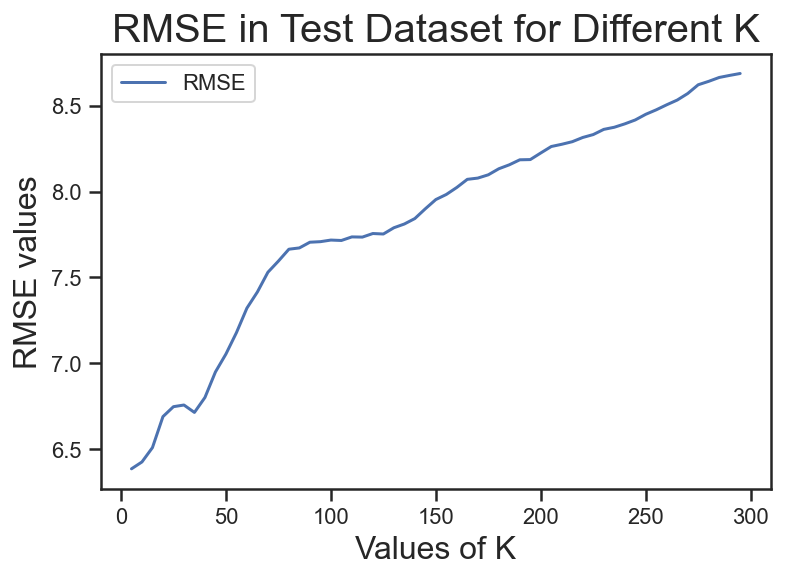

In [130]:
#plotting the rmse values against k values
plt.plot(k_val, rmse_val, label = 'RMSE')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('RMSE values', fontsize = 16)
plt.title ('RMSE in Test Dataset for Different K', fontsize = 20)
plt.legend()

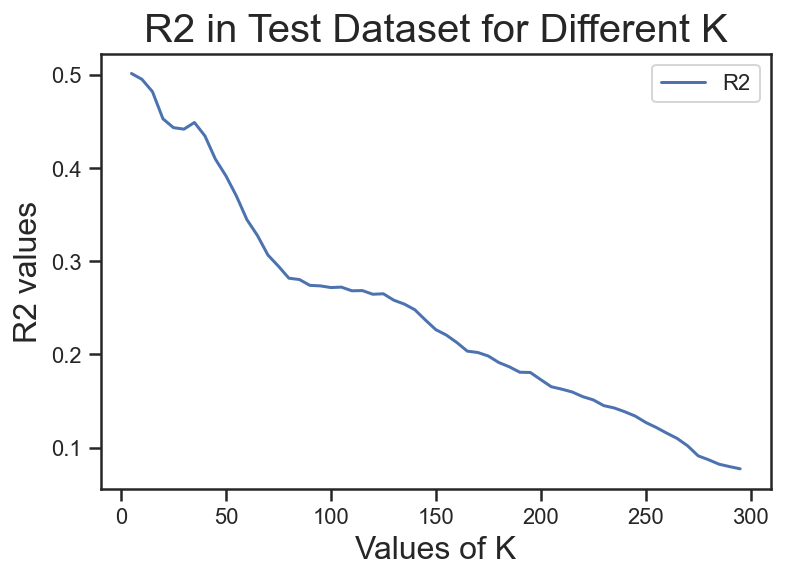

In [131]:
#plotting the rmse values against k values
plt.plot(k_val, R2, label = 'R2')
plt.xlabel ('Values of K', fontsize = 16)
plt.ylabel ('R2 values', fontsize = 16)
plt.title ('R2 in Test Dataset for Different K', fontsize = 20)
plt.legend()

### Using Optimal Value of K

Text(0.5, 1.0, 'K = 5  TrainingR2 = 0.766250  TestR2 = 0.501233')

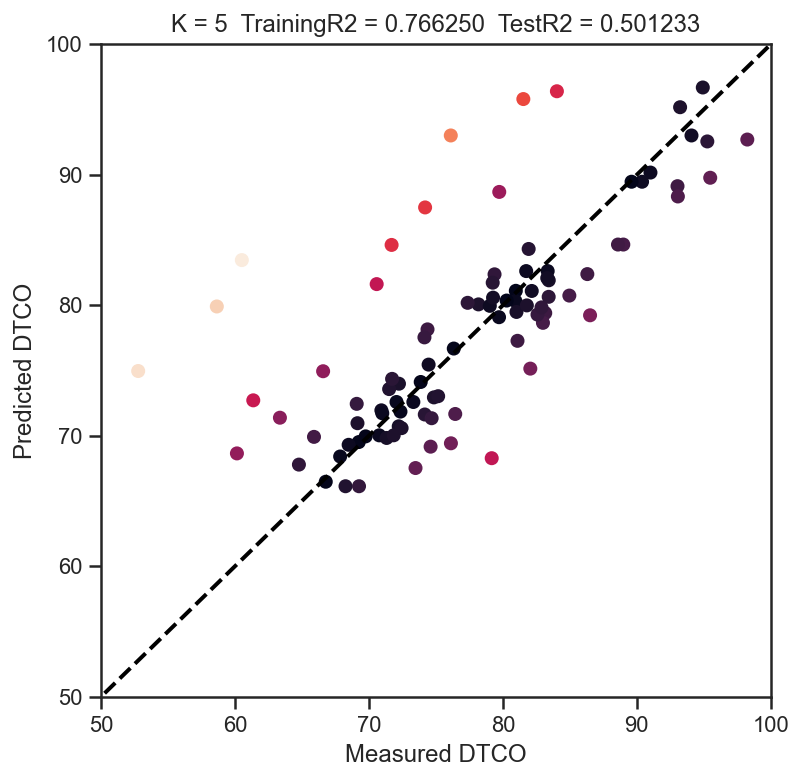

In [182]:
rmse_val = [] # To store rmse values for different k
k_val = []    # To store values of K
R2 = []       # To store R2

K = 5

model = neighbors.KNeighborsRegressor(n_neighbors = K)

model.fit(x_train_knn, y_train_knn)  # fit the model
y_pred_knn = model.predict(x_test_knn) # make prediction on test set
    
training_R2 = model.score(x_train_knn, y_train_knn) # Compute training R2
test_R2 = model.score(x_test_knn, y_test_knn)       # Compute test R2
R2.append(test_R2)
    
error = sqrt(mean_squared_error(y_test_knn, y_pred_knn)) #calculate rmse
rmse_val.append(error)                         #store rmse values
er=abs(y_test_knn - y_pred_knn)  
   
# Also create a series of plots for predicted versus actual DT for different values of K
fig = plt.figure(K, figsize=(6, 6))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_knn, y_pred_knn, c = er)
plt.plot([0, 160],[0, 160], color='black', linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 
plt.title('K = %s  TrainingR2 = %f  TestR2 = %f'%(K, training_R2, test_R2))

In [133]:
NPHI_KNN = pd.DataFrame({'Measured DTCO':y_test_knn, 'Predicted DTCO':y_pred_knn})
NPHI_KNN.head()

,Measured DTCO,Predicted DTCO
285,82.15353,81.091976
150,73.86228,74.115074
122,86.30408,82.384874
594,81.52559,95.801670
20,70.76566,70.024676


In [134]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_knn, y_pred_knn))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_knn, y_pred_knn))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_knn, y_pred_knn)))

Mean Absolute Error: 4.1705635913978485
Mean Squared Error: 40.79099800974179
Root Mean Squared Error: 6.386783072074845


In [135]:
# Calculate the absolute errors
errors = abs(y_pred_knn - y_test_knn)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_knn)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 4.17 degrees.
Accuracy: 94.22 %.


### Linear Regression

In [136]:
x_train_lr = x_train.copy()
x_test_lr = x_test.copy()
y_train_lr = y_train.copy()
y_test_lr = y_test.copy()

In [137]:
from sklearn.linear_model import LinearRegression
clf = LinearRegression()
clf.fit(x_train_lr, y_train_lr)

LinearRegression()

In [138]:
y_pred_lr = clf.predict(x_test_lr)

Text(0.5, 0, 'Measured DTCO')

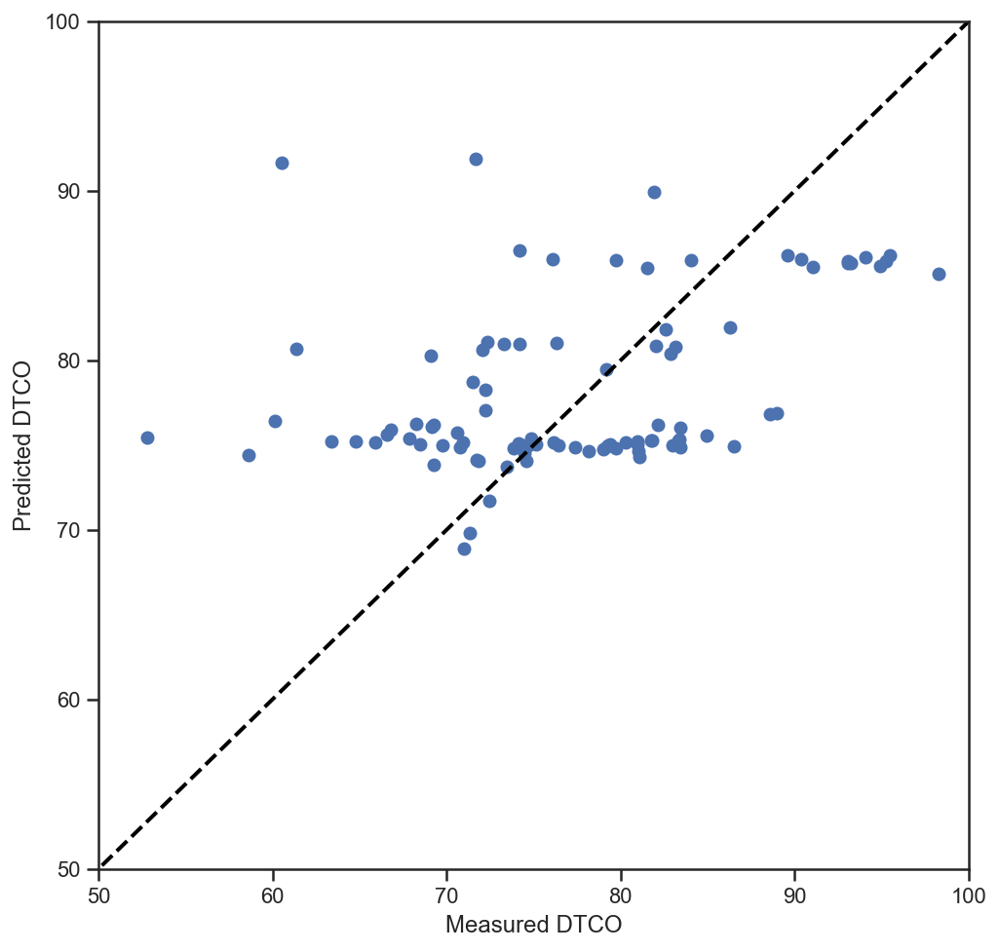

In [139]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_lr, y_pred_lr)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 

In [140]:
NPHI_LinearRegression = pd.DataFrame({'Measured DTCO':y_test_lr, 'Predicted DTCO':y_pred_lr})
NPHI_LinearRegression.head()

,Measured DTCO,Predicted DTCO
285,82.15353,76.208194
150,73.86228,74.810954
122,86.30408,81.916644
594,81.52559,85.442035
20,70.76566,74.878321


In [141]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_lr, y_pred_lr))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_lr, y_pred_lr))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_lr, y_pred_lr)))

Mean Absolute Error: 6.6250644886348935
Mean Squared Error: 70.51767587135129
Root Mean Squared Error: 8.397480328726664


In [142]:
# Calculate the absolute errors
errors = abs(y_pred_lr - y_test_lr)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_lr)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 6.63 degrees.
Accuracy: 91.02 %.


### Support Vector Regression

In [143]:
x_train_svm = x_train.copy()
x_test_svm = x_test.copy()
y_train_svm = y_train.copy()
y_test_svm = y_test.copy()

In [144]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
regressor = SVR(kernel = 'rbf')

regressor.fit(x_train_svm, y_train_svm)

SVR()

In [145]:
y_pred_svm = regressor.predict(x_test_svm) 

Text(0.5, 0, 'Measured DTCO')

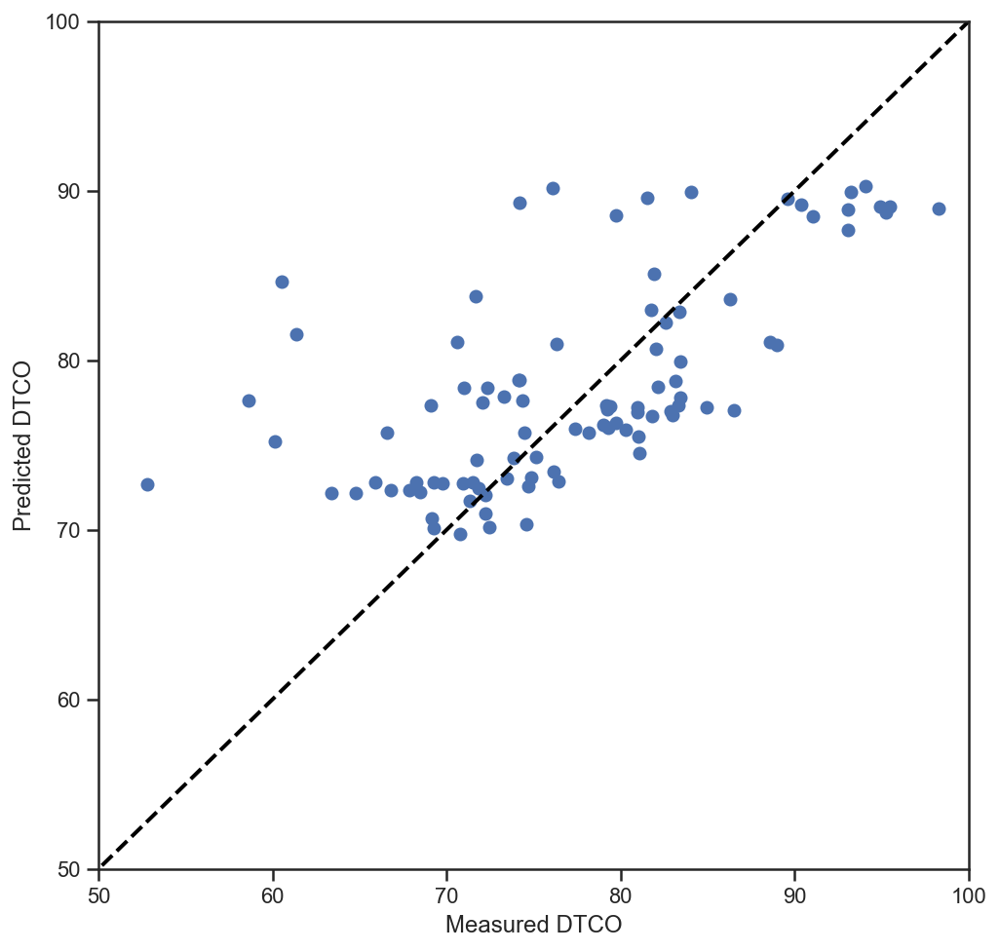

In [146]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_svm, y_pred_svm)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 

In [147]:
NPHI_svm = pd.DataFrame({'Measured DTCO':y_test_svm, 'Predicted DTCO':y_pred_svm})
NPHI_svm.head()

,Measured DTCO,Predicted DTCO
285,82.15353,78.447366
150,73.86228,74.262777
122,86.30408,83.623768
594,81.52559,89.577723
20,70.76566,69.757519


In [148]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_svm, y_pred_svm))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_svm, y_pred_svm))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_svm, y_pred_svm)))

Mean Absolute Error: 5.211025781874128
Mean Squared Error: 48.638266558424085
Root Mean Squared Error: 6.974114033941809


In [149]:
# Calculate the absolute errors
errors = abs(y_pred_svm - y_test_svm)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_svm)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 5.21 degrees.
Accuracy: 92.84 %.


### Hyperparameter Optimization for the SVR

In [150]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
grid = GridSearchCV(
        estimator=SVR(kernel='rbf'),
        param_grid={
            'C': [0.1, 1, 2, 5, 10, 20, 50, 100, 1000],
            'epsilon': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1],
            'gamma': [0.001, 0.01, 0.1, 1, 10],
            'kernel': ['rbf']
        },
        cv=10, verbose=0)

In [151]:
grid.fit(x_train_svm, y_train_svm)

GridSearchCV(cv=10, estimator=SVR(),
             param_grid={'C': [0.1, 1, 2, 5, 10, 20, 50, 100, 1000],
                         'epsilon': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1],
                         'gamma': [0.001, 0.01, 0.1, 1, 10],
                         'kernel': ['rbf']})

In [152]:
print("Score on test set: %f" % grid.score(x_test_svm, y_test_svm))
print("Best parameters: %s" % grid.best_params_)

Score on test set: 0.554175
Best parameters: {'C': 100, 'epsilon': 0.1, 'gamma': 10, 'kernel': 'rbf'}


In [153]:
cv_results = pd.DataFrame(grid.cv_results_)
cv_results_tiny = cv_results[['param_C', 'mean_test_score']]
cv_results_tiny.sort_values(by='mean_test_score', ascending=False).head(5)

,param_C,mean_test_score
269,100,0.611606
264,100,0.611337
249,100,0.611048
254,100,0.611041
259,100,0.611032


### Reapply the SVR with Optimal Parameters again 

In [154]:
grid_new=grid.best_estimator_

In [155]:
print('memorization performance: ', grid_new.score(x_train_svm,y_train_svm)) # memorization

print('generalization performance: ', grid_new.score(x_test_svm,y_test_svm))  # generalization

memorization performance:  0.7169570792952692
generalization performance:  0.5541746598968562


In [156]:
y_pred_svmop = grid_new.predict(x_test_svm)

Text(0.5, 0, 'Measured DTCO')

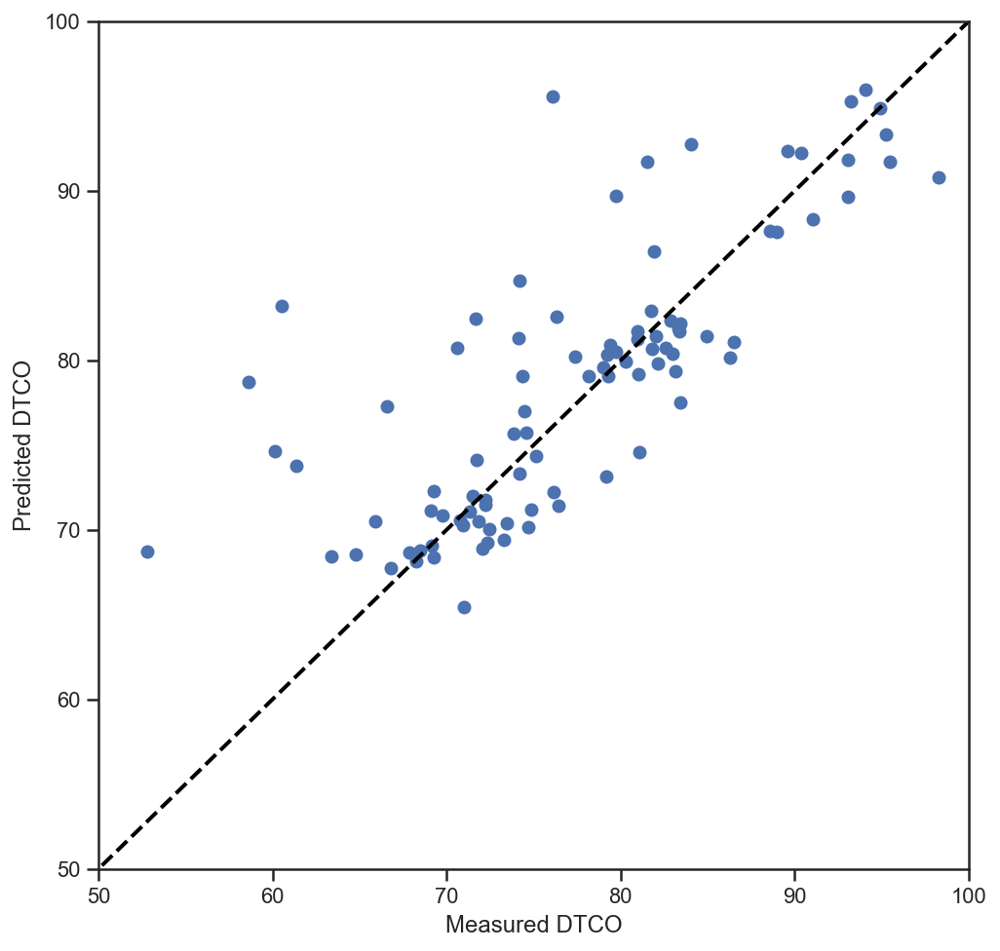

In [157]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_svm, y_pred_svmop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 

In [158]:
NPHI_svm_OP = pd.DataFrame({'Measured NPHI':y_test_svm, 'Predicted NPHI':y_pred_svmop})
NPHI_svm_OP.head()

,Measured NPHI,Predicted NPHI
285,82.15353,79.801929
150,73.86228,75.695247
122,86.30408,80.156328
594,81.52559,91.715531
20,70.76566,70.572012


In [159]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_svm, y_pred_svmop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_svm, y_pred_svmop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_svm, y_pred_svmop)))

Mean Absolute Error: 3.9554633783085507
Mean Squared Error: 36.461220245226585
Root Mean Squared Error: 6.038312698529829


In [160]:
# Calculate the absolute errors
errors = abs(y_pred_svmop - y_test_svm)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_svm)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 3.96 degrees.
Accuracy: 94.5 %.


### MLP Regression

In [161]:
x_train_mlp = x_train.copy()
x_test_mlp = x_test.copy()
y_train_mlp = y_train.copy()
y_test_mlp = y_test.copy()

In [162]:
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor
nn_rgr = rgr = MLPRegressor(hidden_layer_sizes = (15, 45, 25, 100), random_state=1, max_iter=300)

nn_rgr.fit(x_train_mlp,y_train_mlp)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPRegressor(hidden_layer_sizes=(15, 45, 25, 100), max_iter=300, random_state=1)

In [163]:
y_pred_mlp = nn_rgr.predict(x_test_mlp)

Text(0.5, 0, 'Measured DTCO')

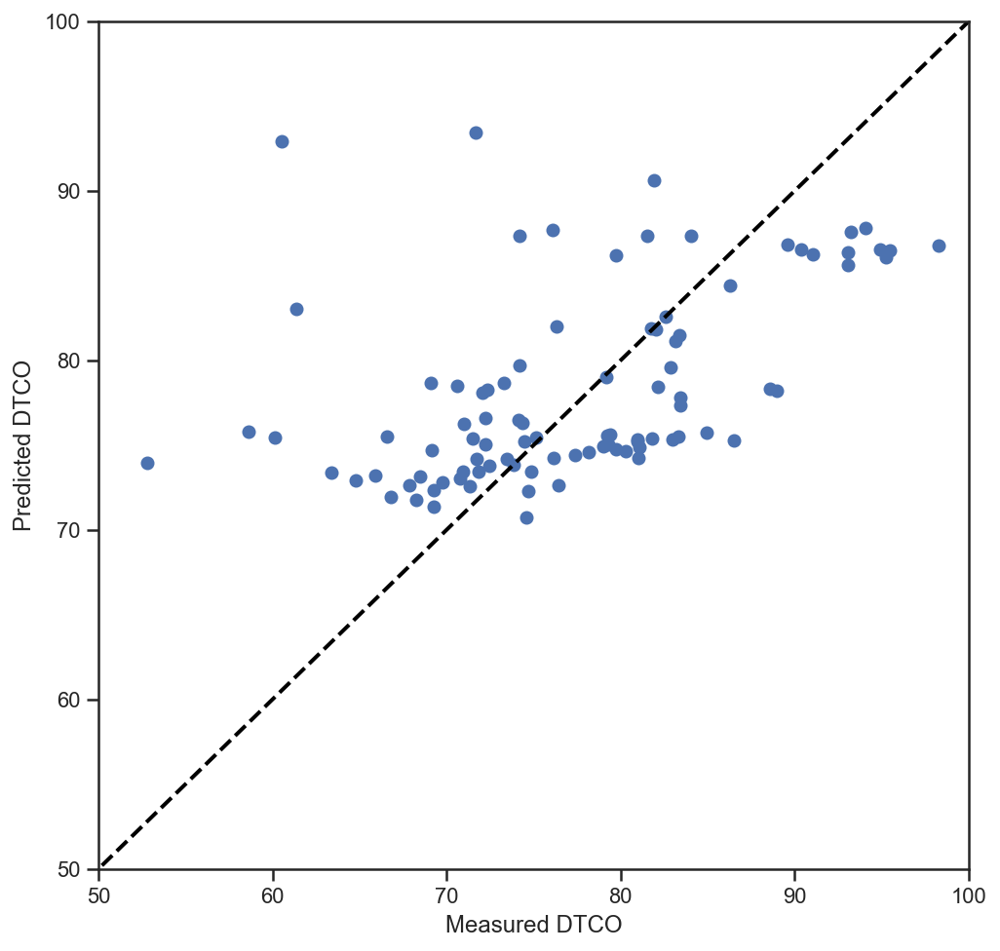

In [164]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_mlp, y_pred_mlp)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 

In [165]:
NPHI_mlp= pd.DataFrame({'Measured DTCO':y_test_mlp, 'Predicted DTCO':y_pred_mlp})
NPHI_mlp.head()

,Measured DTCO,Predicted DTCO
285,82.15353,78.436609
150,73.86228,73.849363
122,86.30408,84.394337
594,81.52559,87.361782
20,70.76566,73.017001


In [166]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_mlp, y_pred_mlp))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_mlp, y_pred_mlp))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_mlp, y_pred_mlp)))

Mean Absolute Error: 6.013169605141185
Mean Squared Error: 63.56175823093691
Root Mean Squared Error: 7.972562839572787


In [167]:
# Calculate the absolute errors
errors = abs(y_pred_mlp - y_test_mlp)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_mlp)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 6.01 degrees.
Accuracy: 91.82 %.


### Hyperparameter Optimization using MLP

In [168]:
import itertools 

In [169]:
%%time

params = {'activation': ['relu', 'tanh', 'logistic', 'identity'],
          'hidden_layer_sizes': list(itertools.permutations([50,100,150],2)) + list(itertools.permutations([50,100,150],3)) + [50,100,150],
          'solver': ['adam', 'lbfgs'],
          'learning_rate' : ['constant', 'adaptive', 'invscaling']
         }

mlp_regressor_grid = GridSearchCV(MLPRegressor(random_state=123), param_grid=params, cv=5, verbose=5)

CPU times: user 199 µs, sys: 48 µs, total: 247 µs
Wall time: 43.2 µs


In [170]:
grid_mlp = mlp_regressor_grid.fit(x_train_mlp,y_train_mlp)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 360 candidates, totalling 1800 fits
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.490, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.150, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.284, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.9s remaining:    0.0s


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.205, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.733, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.611, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.441, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.542, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.614, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.417, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.490, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.150, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.284, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.205, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.733, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.611, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.441, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.542, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.614, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.417, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-0.490, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-0.150, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-0.284, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-0.205, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-0.733, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.611, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.441, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.542, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.614, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.417, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.063, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.027, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.013, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=0.021, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.532, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.600, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.533, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.531, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.546, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.508, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.063, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.027, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.013, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=0.021, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.532, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.600, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.533, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.531, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.546, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.508, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.063, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.027, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.013, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=0.021, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.532, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.600, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.533, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.531, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.546, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.508, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-0.108, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-0.057, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-0.061, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.025, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-0.650, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.647, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.547, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.494, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.637, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.320, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.108, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.057, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.061, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=0.025, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.650, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.647, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.547, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.494, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.637, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.320, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-0.108, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-0.057, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-0.061, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=0.025, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-0.650, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.647, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.547, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.494, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.637, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.320, total=   0.4s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.120, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.085, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.195, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.211, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.403, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.592, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.595, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.559, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.661, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.430, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.120, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.085, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.195, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.211, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.403, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.592, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.595, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.559, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.661, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.430, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.120, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.085, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.195, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.211, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.403, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.592, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.595, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.559, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.661, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.430, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-0.526, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-0.327, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-0.458, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-0.305, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-0.913, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.655, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.572, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.523, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.660, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.409, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.526, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.327, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.458, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.305, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.913, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.655, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.572, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.523, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.660, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.409, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.526, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.327, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.458, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.305, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.913, total=   0.6s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.655, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.572, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.523, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.660, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.409, total=   0.5s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.132, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.103, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.182, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.212, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-0.395, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.608, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.635, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.548, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.654, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.387, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.132, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.103, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.182, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.212, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-0.395, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.608, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.635, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.548, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.654, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.387, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.132, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.103, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.182, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.212, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-0.395, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.608, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.635, total=   0.7s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.548, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.654, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.387, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.434, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.225, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.351, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.453, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.169, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.642, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.554, total=   1.3s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.605, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.653, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.428, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.434, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.225, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.351, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.453, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.169, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.642, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.554, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.605, total=   1.3s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.653, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.428, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.434, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.225, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.351, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.453, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.169, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.642, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.554, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.605, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.653, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.428, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=0.450, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=0.313, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=0.406, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=0.498, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=0.286, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.606, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.509, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.528, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.668, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.416, total=   1.3s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=0.450, total=   1.3s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=0.313, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=0.406, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=0.498, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=0.286, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.606, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.509, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.528, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.668, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.416, total=   1.4s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=0.450, total=   1.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=0.313, total=   1.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=0.406, total=   1.5s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=0.498, total=   1.3s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=0.286, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.606, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.509, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.528, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.668, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.416, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.400, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.236, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.338, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.420, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.168, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.618, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.589, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.554, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.671, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.337, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=0.400, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=0.236, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=0.338, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=0.420, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=0.168, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.618, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.589, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.554, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.671, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.337, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=0.400, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=0.236, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=0.338, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=0.420, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=0.168, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.618, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.589, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.554, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.671, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.337, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=0.456, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=0.244, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=0.384, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=0.437, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=0.220, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.624, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.570, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.552, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.683, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.410, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=0.456, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=0.244, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=0.384, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=0.437, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=0.220, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.624, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.570, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.552, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.683, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.410, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=0.456, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=0.244, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=0.384, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=0.437, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=0.220, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.624, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.570, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.552, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.683, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.410, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=0.433, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=0.237, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=0.325, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=0.438, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=0.129, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.600, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.573, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.569, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.654, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.452, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=0.433, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=0.237, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=0.325, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=0.438, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=0.129, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.600, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.573, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.569, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.654, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.452, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=0.433, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=0.237, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=0.325, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=0.438, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=0.129, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.600, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.573, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.569, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.654, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.452, total=   0.8s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.425, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.276, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.338, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.441, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=0.232, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.640, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.483, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.592, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.641, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.320, total=   1.2s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.425, total=   1.1s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.276, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.338, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.441, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=0.232, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.640, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.483, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.592, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.641, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.320, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=0.425, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=0.276, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=0.338, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=0.441, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=0.232, total=   0.9s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.640, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.483, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.592, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.641, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.320, total=   1.0s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-19.801, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-24.175, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-21.472, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-18.368, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-28.551, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.597, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.463, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.524, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.573, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.418, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-19.801, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-24.175, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-21.472, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-18.368, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-28.551, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.597, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.463, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.524, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.573, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.418, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-19.801, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-24.175, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-21.472, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-18.368, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-28.551, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.597, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.463, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.524, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.573, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.418, total=   0.1s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-5.201, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-5.061, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-5.831, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-4.467, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-5.414, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.643, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.587, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.500, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.619, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.390, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-5.201, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-5.061, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-5.831, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-4.467, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-5.414, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.643, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.587, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.500, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.619, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.390, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-5.201, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-5.061, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-5.831, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-4.467, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-5.414, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.643, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.587, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.500, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.619, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.390, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.835, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.648, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-4.150, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.308, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.651, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.573, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.459, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.516, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.589, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.385, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.835, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.648, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-4.150, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.308, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.651, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.573, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.459, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.516, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.589, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.385, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.835, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.648, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-4.150, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.308, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.651, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.573, total=   0.3s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.459, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.516, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.589, total=   0.2s
[CV] activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=relu, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.385, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-3.066, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-3.582, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-3.089, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-2.937, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-4.883, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.574, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.532, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.573, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.647, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.360, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-3.066, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-3.582, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-3.089, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-2.937, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-4.883, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.574, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.532, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.573, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.647, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.360, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-3.066, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-3.582, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-3.089, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-2.937, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-4.883, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.574, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.532, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.573, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.647, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.360, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.180, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.105, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.166, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.176, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.295, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.318, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.510, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.454, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.649, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.082, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.180, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.105, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.166, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.176, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.295, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.318, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.510, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.454, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.649, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.082, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.180, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.105, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.166, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.176, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.295, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.318, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.510, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.454, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.649, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.082, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-18.551, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-23.808, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-19.092, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-17.664, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-29.067, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.573, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.471, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.404, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.619, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.404, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-18.551, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-23.808, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-19.092, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-17.664, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-29.067, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.573, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.471, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.404, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.619, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.404, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-18.551, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-23.808, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-19.092, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-17.664, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-29.067, total=   0.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.573, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.471, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.404, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.619, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.404, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.265, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.197, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.249, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.262, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.451, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.173, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.508, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.639, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.594, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.330, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.265, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.197, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.249, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.262, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.451, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.173, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.508, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.639, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.594, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.330, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.265, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.197, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.249, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.262, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.451, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.173, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.508, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.639, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.594, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.330, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-18.188, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-23.346, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-18.719, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-17.335, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-28.510, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.316, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.492, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.371, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.471, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.277, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-18.188, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-23.346, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-18.719, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-17.335, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-28.510, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.316, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.492, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.371, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.471, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.277, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-18.188, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-23.346, total=   0.6s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-18.719, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-17.335, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-28.510, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.316, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.492, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.371, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.471, total=   0.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.277, total=   0.8s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-3.344, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-3.953, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-3.376, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-3.197, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-5.314, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.563, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.436, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.367, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.592, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.406, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-3.344, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-3.953, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-3.376, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-3.197, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-5.314, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.563, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.436, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.367, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.592, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.406, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-3.344, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-3.953, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-3.376, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-3.197, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-5.314, total=   0.9s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.563, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.436, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.367, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.592, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.406, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-0.350, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-0.289, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-0.333, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-0.347, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-0.601, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.591, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.161, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.604, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.651, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.123, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-0.350, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-0.289, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-0.333, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-0.347, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-0.601, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.591, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.161, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.604, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.651, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.123, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-0.350, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-0.289, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-0.333, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-0.347, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-0.601, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.591, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.161, total=   6.8s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.604, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.651, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.123, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-3.896, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-4.676, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-3.957, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-3.749, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-6.254, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.571, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.422, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.497, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.566, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.279, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-3.896, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-4.676, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-3.957, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-3.749, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-6.254, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.571, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.422, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.497, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.566, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.279, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-3.896, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-4.676, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-3.957, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-3.749, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-6.254, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.571, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.422, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.497, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.566, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.279, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.316, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.262, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.304, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.321, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-0.562, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.500, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.444, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.486, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.683, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.391, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-0.316, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-0.262, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-0.304, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-0.321, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-0.562, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.500, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.444, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.486, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.683, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.391, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-0.316, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-0.262, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-0.304, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-0.321, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-0.562, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.500, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.444, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.486, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.683, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.391, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-18.513, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-23.778, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-19.063, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-17.633, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-28.995, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.564, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.509, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.401, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.622, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.304, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-18.513, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-23.778, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-19.063, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-17.633, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-28.995, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.564, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.509, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.401, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.622, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.304, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-18.513, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-23.778, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-19.063, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-17.633, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-28.995, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.564, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.509, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.401, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.622, total=   1.6s
[CV] activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.304, total=   1.7s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-3.570, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-4.257, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-3.630, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-3.424, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-5.708, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.447, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.462, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.493, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.598, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.433, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-3.570, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-4.257, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-3.630, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-3.424, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-5.708, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.447, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.462, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.493, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.598, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.433, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-3.570, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-4.257, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-3.630, total=   1.0s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-3.424, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-5.708, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.447, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.462, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.493, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.598, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.433, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-19.145, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-24.612, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-19.732, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-18.260, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-30.019, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.420, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.419, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.391, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.651, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.372, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-19.145, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-24.612, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-19.732, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-18.260, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-30.019, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.420, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.419, total=   1.5s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.391, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.651, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.372, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-19.145, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-24.612, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-19.732, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-18.260, total=   1.2s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-30.019, total=   1.1s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.420, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.419, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.391, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.651, total=   1.3s
[CV] activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.372, total=   1.4s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-19.592, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-24.604, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-20.676, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-18.484, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-29.486, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.641, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.359, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.458, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.533, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.319, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-19.592, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-24.604, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-20.676, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-18.484, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-29.486, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.641, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.359, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.458, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.533, total=   0.1s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.319, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-19.592, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-24.604, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-20.676, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-18.484, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-29.486, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.641, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.359, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.458, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.533, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=tanh, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.319, total=   0.2s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-4.790, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-5.046, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-5.135, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-4.274, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-6.091, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.534, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.580, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.645, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.661, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.287, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-4.790, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-5.046, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-5.135, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-4.274, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-6.091, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.534, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.580, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.645, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.661, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.287, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-4.790, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-5.046, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-5.135, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-4.274, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-6.091, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.534, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.580, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.645, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.661, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.287, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-1.896, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-1.566, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-1.987, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-1.620, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-1.622, total=   0.3s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.514, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.472, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.530, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.678, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.371, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-1.896, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-1.566, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-1.987, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-1.620, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-1.622, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.514, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.472, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.530, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.678, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.371, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.896, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.566, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.987, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.620, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-1.622, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.514, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.472, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.530, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.678, total=   0.4s
[CV] activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=tanh, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.371, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-7.055, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-8.709, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-7.181, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-6.735, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-11.140, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.473, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.537, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.596, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.490, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.415, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-7.055, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-8.709, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-7.181, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-6.735, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-11.140, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.473, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.537, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.596, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.490, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.415, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-7.055, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-8.709, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-7.181, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-6.735, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-11.140, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.473, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.537, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.596, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.490, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.415, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-1.061, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-1.105, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-1.063, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-1.035, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-1.751, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.215, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.371, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.293, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.498, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.203, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-1.061, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-1.105, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-1.063, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-1.035, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-1.751, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.215, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.371, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.498, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.203, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-1.061, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-1.105, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-1.063, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-1.035, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-1.751, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.215, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.371, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.498, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.203, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-31.109, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-40.467, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-32.119, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-29.621, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-48.661, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.518, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.476, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.480, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.652, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.395, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-31.109, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-40.467, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-32.119, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-29.621, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-48.661, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.518, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.476, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.480, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.652, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.395, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-31.109, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-40.467, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-32.119, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-29.621, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-48.661, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.518, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.476, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.480, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.652, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.395, total=   0.5s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-1.836, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-2.065, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-1.843, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-1.773, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-2.983, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.604, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.497, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.715, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.609, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.467, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-1.836, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-2.065, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-1.843, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-1.773, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-2.983, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.604, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.497, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.715, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.609, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.467, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-1.836, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-2.065, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-1.843, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-1.773, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-2.983, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.604, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.497, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.715, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.609, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.467, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-40.729, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-53.255, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-42.093, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-38.762, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-63.610, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.483, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.525, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.511, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.580, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.217, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-40.729, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-53.255, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-42.093, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-38.762, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-63.610, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.483, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.525, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.511, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.580, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.217, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-40.729, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-53.255, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-42.093, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-38.762, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-63.610, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.483, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.525, total=   0.8s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.511, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.580, total=   0.7s
[CV] activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.217, total=   0.6s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-13.680, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-17.409, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-14.045, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-13.035, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-21.486, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.654, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.494, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.547, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.705, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.185, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-13.680, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-17.409, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-14.045, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-13.035, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-21.486, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.654, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.494, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.547, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.705, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.185, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-13.680, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-17.409, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-14.045, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-13.035, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-21.486, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.654, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.494, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.547, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.705, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.185, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-3.690, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-4.393, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-3.739, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-3.536, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=-5.878, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.615, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.566, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.628, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.663, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.312, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-3.690, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-4.393, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-3.739, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-3.536, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=-5.878, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.615, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.566, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.628, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.663, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.312, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-3.690, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-4.393, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-3.739, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-3.536, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=-5.878, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.615, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.566, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.628, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.663, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.312, total=   1.7s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-14.971, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-19.110, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-15.402, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-14.296, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=adam, score=-23.591, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.435, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.345, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.605, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.644, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=constant, solver=lbfgs, score=0.359, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-14.971, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-19.110, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-15.402, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-14.296, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=adam, score=-23.591, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.435, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.345, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.605, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.644, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=adaptive, solver=lbfgs, score=0.359, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-14.971, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-19.110, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-15.402, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-14.296, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=adam, score=-23.591, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.435, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.345, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.605, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.644, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(50, 150, 100), learning_rate=invscaling, solver=lbfgs, score=0.359, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-2.637, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-3.077, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-2.678, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-2.558, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=-4.283, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.584, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.378, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.493, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.653, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=lbfgs, score=0.371, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-2.637, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-3.077, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-2.678, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-2.558, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=adam, score=-4.283, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.584, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.378, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.493, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.653, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=adaptive, solver=lbfgs, score=0.371, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-2.637, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-3.077, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-2.678, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-2.558, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=adam, score=-4.283, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.584, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.378, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.493, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.653, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 50, 150), learning_rate=invscaling, solver=lbfgs, score=0.371, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-35.967, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-46.919, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-37.157, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-34.234, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=adam, score=-56.182, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.501, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.422, total=   1.4s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.454, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.617, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.393, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-35.967, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-46.919, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-37.157, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-34.234, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=-56.182, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.501, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.422, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.454, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.617, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=lbfgs, score=0.393, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-35.967, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-46.919, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-37.157, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-34.234, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=adam, score=-56.182, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.501, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.422, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.454, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.617, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(100, 150, 50), learning_rate=invscaling, solver=lbfgs, score=0.393, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-10.560, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-13.335, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-10.851, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-10.091, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=adam, score=-16.652, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.561, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.415, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.607, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.534, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=constant, solver=lbfgs, score=0.397, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-10.560, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-13.335, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-10.851, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-10.091, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=adam, score=-16.652, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.561, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.415, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.607, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.534, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.397, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-10.560, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-13.335, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-10.851, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-10.091, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam, score=-16.652, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.561, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.415, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.607, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.534, total=   1.0s
[CV] activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=lbfgs, score=0.397, total=   0.9s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-33.079, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-43.077, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-34.163, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-31.504, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=adam, score=-51.723, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.395, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.581, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.398, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.514, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=constant, solver=lbfgs, score=0.193, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-33.079, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-43.077, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-34.163, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-31.504, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=adam, score=-51.723, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.395, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.581, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.398, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.514, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=adaptive, solver=lbfgs, score=0.193, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-33.079, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-43.077, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-34.163, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-31.504, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=-51.723, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.395, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.581, total=   1.3s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.398, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.514, total=   1.2s
[CV] activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.193, total=   1.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-31.575, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-40.798, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-32.858, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-29.958, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-48.808, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.192, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.534, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.630, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.659, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.333, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-31.575, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-40.798, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-32.858, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-29.958, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-48.808, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.192, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.534, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.630, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.659, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.333, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-31.575, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-40.798, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-32.858, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-29.958, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-48.808, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.192, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.534, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.630, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.659, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.333, total=   0.1s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-11.427, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-14.001, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-11.964, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-10.694, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-17.101, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.523, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.396, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.572, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.689, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.406, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-11.427, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-14.001, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-11.964, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-10.694, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-17.101, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.523, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.396, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.572, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.689, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.406, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-11.427, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-14.001, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-11.964, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-10.694, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-17.101, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.523, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.396, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.572, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.689, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.406, total=   0.2s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.854, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-4.230, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-4.106, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.574, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-5.401, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.571, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.274, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.580, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.674, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.414, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.854, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-4.230, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-4.106, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.574, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-5.401, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.571, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.274, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.580, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.674, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.414, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.854, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-4.230, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-4.106, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.574, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-5.401, total=   0.4s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.571, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.274, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.580, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.674, total=   0.3s
[CV] activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV]  activation=logistic, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.414, total=   0.3s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.045, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.082, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.105, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=0.145, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=adam, score=-0.357, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=constant, solver=lbfgs, score=0.376, total=   0.0s
[CV] activatio

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=0.045, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=0.082, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=0.105, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=0.145, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=adam, score=-0.357, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.0s
[CV] activatio

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=0.045, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=0.082, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=0.105, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=0.145, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=adam, score=-0.357, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100), learning_rate=invscaling, solver=lbfgs, score=0.376, total=   0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=0.152, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=0.135, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=0.177, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=0.235, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=adam, score=-0.167, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=constant, solver=lbfgs, score=0.376, total=   0.1s
[CV] activatio

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=0.152, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=0.135, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=0.177, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=0.235, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=adam, score=-0.167, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.1s
[CV] activatio

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=0.152, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=0.135, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=0.177, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=0.235, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=adam, score=-0.167, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 150), learning_rate=invscaling, solver=lbfgs, score=0.376, total=   0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.105, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.109, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.197, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=0.210, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=adam, score=-0.327, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=constant, solver=lbfgs, score=0.376, total=   0.1s
[CV] activatio

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=0.105, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=0.109, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=0.197, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=0.210, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=adam, score=-0.327, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.1s
[CV] activatio

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=0.105, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=0.109, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=0.197, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=0.210, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=adam, score=-0.327, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 50), learning_rate=invscaling, solver=lbfgs, score=0.376, total=   0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.273, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.150, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.268, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=0.327, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=adam, score=-0.069, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.183, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=constant, solver=lbfgs, score=0.376, total=   0.1s
[CV] 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.273, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.150, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.268, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=0.327, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=adam, score=-0.069, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.1s
[CV] 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.273, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.150, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.268, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=0.327, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=adam, score=-0.069, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150), learning_rate=invscaling, solver=lbfgs, score=0.376, t

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.210, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.133, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.243, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=0.287, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=adam, score=-0.175, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=constant, solver=lbfgs, score=0.376, total=   0.1s
[CV] activatio

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=0.210, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=0.133, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=0.243, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=0.287, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=adam, score=-0.175, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.1s
[CV] activatio

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=0.210, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=0.133, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=0.243, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=0.287, total=   0.5s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=adam, score=-0.175, total=   0.4s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50), learning_rate=invscaling, solver=lbfgs, score=0.376, total=   0

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.289, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.165, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.267, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=0.308, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=adam, score=-0.094, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=constant, solver=lbfgs, score=0.376, total=   0.1s
[CV] 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.289, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.165, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.267, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=0.308, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=adam, score=-0.094, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.1s
[CV] 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.289, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.165, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.267, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=0.308, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=adam, score=-0.094, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100), learning_rate=invscaling, solver=lbfgs, score=0.376, t

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.352, total=   1.0s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.178, total=   0.9s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.272, total=   0.7s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.373, total=   0.8s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=adam, score=0.059, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.356, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs, score=0.183, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=constant, solver=lbfgs,

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.352, total=   0.8s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.178, total=   0.9s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.272, total=   0.7s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.373, total=   0.9s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=adam, score=0.059, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=adaptive, solver=lbfgs,

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.352, total=   0.8s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.178, total=   0.8s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.272, total=   0.7s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.373, total=   0.8s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=adam, score=0.059, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(50, 100, 150), learning_rate=invscal

[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.347, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.184, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.264, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score=0.376, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 50, 150), learning_rate=constant, solver=adam, score

[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.376, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=constant, solver=lbfgs, score=0.082, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=0.357, total=   0.7s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, score=0.186, total=   0.6s
[CV] activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(100, 150, 50), learning_rate=adaptive, solver=adam, sc

[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=adaptive, solver=lbfgs, score=0.082, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 50, 100), learning_rate=invscaling, solver=

[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=0.374, total=   0.7s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=adam, score=0.067, total=   0.7s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=(150, 100, 50), learning_rate=invscal

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-5.656, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-5.709, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-6.459, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-5.001, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=adam, score=-6.274, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=constant, solver=lbfgs, score=0.376, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=constant, solv

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-5.709, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-6.459, total=   0.1s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-5.001, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=adam, score=-6.274, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=adaptive, solve

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-5.709, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-6.459, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-5.001, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=adam, score=-6.274, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.376, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=50, learning_rate=invscaling, solver=lbfgs, score=0.082, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-3.725, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-3.567, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-3.943, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-3.211, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=adam, score=-3.531, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=constant, solver=lbfgs, score=0.376, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=cons

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-3.725, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-3.567, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-3.943, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-3.211, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=adam, score=-3.531, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=adap

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-3.725, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-3.567, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-3.943, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-3.211, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=adam, score=-3.531, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=100, learning_rate=invscaling, solver=lbfgs, score=0.376, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=100, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.302, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.188, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.480, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-2.866, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=adam, score=-3.150, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=constant, solver=lbfgs, score=0.376, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=cons

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.302, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.188, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.480, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-2.866, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=adam, score=-3.150, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=adaptive, solver=lbfgs, score=0.376, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=adap

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.302, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.188, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.480, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-2.866, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam 


/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=1)]: Done 1800 out of 1800 | elapsed: 20.2min finished


[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=adam, score=-3.150, total=   0.2s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.356, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.183, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.293, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs 
[CV]  activation=identity, hidden_layer_sizes=150, learning_rate=invscaling, solver=lbfgs, score=0.376, total=   0.0s
[CV] activation=identity, hidden_layer_sizes=150, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [171]:
print('Train R^2 Score : %.3f'%mlp_regressor_grid.best_estimator_.score(x_train_mlp, y_train_mlp))
print('Test R^2 Score : %.3f'%mlp_regressor_grid.best_estimator_.score(x_test_mlp, y_test_mlp))
print('Best R^2 Score Through Grid Search : %.3f'%mlp_regressor_grid.best_score_)
print('Best Parameters : ',mlp_regressor_grid.best_params_)

Train R^2 Score : 0.693
Test R^2 Score : 0.522
Best R^2 Score Through Grid Search : 0.578
Best Parameters :  {'activation': 'logistic', 'hidden_layer_sizes': (100, 150), 'learning_rate': 'constant', 'solver': 'lbfgs'}


### Reapply the MLP with Optimal Parameters again


In [172]:
grid_mlp_new=grid_mlp.best_estimator_

In [173]:
print('memorization performance: ', grid_mlp_new.score(x_train_mlp,y_train_mlp)) # memorization

print('generalization performance: ', grid_mlp_new.score(x_test_mlp,y_test_mlp))  # generalization

memorization performance:  0.6931468477851246
generalization performance:  0.521621423799287


In [174]:
y_pred_mlpop = grid_mlp_new.predict(x_test_mlp)

Text(0.5, 0, 'Measured DTCO')

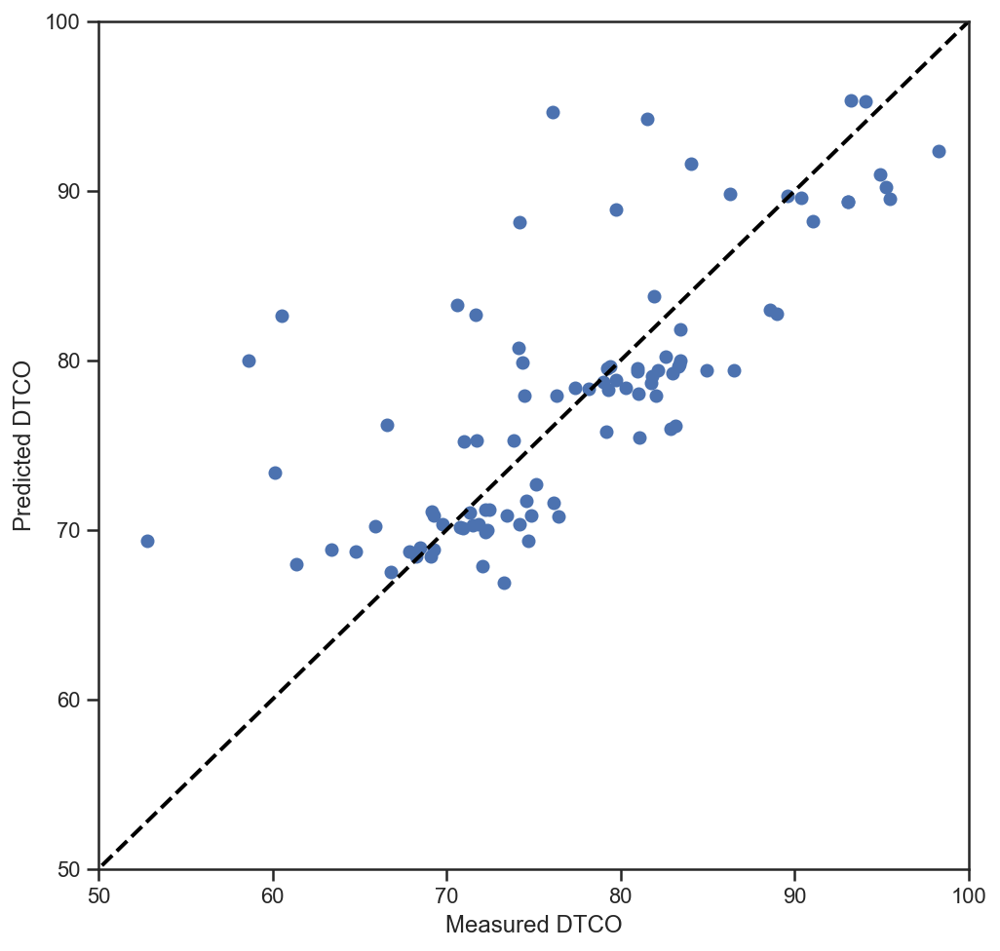

In [175]:
fig = plt.figure(1, figsize=(8, 8))
plt.axis([50, 100, 50, 100])
plt.scatter(y_test_mlp, y_pred_mlpop)
plt.plot([0,100],[0,100],color='black',linewidth=2, linestyle='--')
plt.ylabel('Predicted DTCO') # Predicted values on y axis
plt.xlabel('Measured DTCO') 

In [176]:
NPHI_mlp_OP = pd.DataFrame({'Measured DTCO':y_test_mlp, 'Predicted DTCO':y_pred_mlpop})
NPHI_mlp_OP.head()

,Measured DTCO,Predicted DTCO
285,82.15353,79.403115
150,73.86228,75.284256
122,86.30408,89.792983
594,81.52559,94.220385
20,70.76566,70.138576


In [177]:
# Calculate the absolute errors
errors = abs(y_pred_mlpop - y_test_mlp)

# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

# Calculate mean absolute percentage error (MAPE)
mape = 100 * (errors / y_test_mlp)

# Calculate and display accuracy
accuracy = 100 - np.mean(mape)
print('Accuracy:', round(accuracy, 2), '%.')

Mean Absolute Error: 4.38 degrees.
Accuracy: 94.01 %.


In [184]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_mlp, y_pred_mlpop))
print('Mean Squared Error:', metrics.mean_squared_error(y_test_mlp, y_pred_mlpop))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test_mlp, y_pred_mlpop)))

Mean Absolute Error: 4.378385941230583
Mean Squared Error: 39.12354246938219
Root Mean Squared Error: 6.254881491234041
